<a href="https://colab.research.google.com/github/H-Qayyum/Deep-Learning-Project-Garbage-Classification/blob/main/DataProcessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


This notebook details all the steps taken to compile, clean, and augment the datasets used for EcoSort.

In [ ]:
!pip install -U numpy pandas fastdup renumics-spotlight

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 26.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 31.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.2/75.2 MB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 19.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.4/345.4 kB 19.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 36.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 264.6/264.6 kB 20.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.8/33.8 MB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 334.0/334.0 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.9/55.9 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 510.5/510.5 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.5/45.5 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=False)
import time
import os
import numpy as np
import torch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data.sampler import SubsetRandomSampler
from sklearn.model_selection import train_test_split
from imutils import paths
import shutil
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
from pathlib import Path
import pandas as pd
import fastdup
from renumics import spotlight
from renumics.spotlight.analysis import DataIssue
from matplotlib import image as mpimg

Mounted at /content/gdrive


####Importing the Data####

In [ ]:
if not os.path.exists('/root/datasets/FinalDataset'):
        os.makedirs('/root/datasets/FinalDataset')

if not os.path.exists('/root/datasets/CleanedDataset'):
        os.makedirs('/root/datasets/CleanedDataset')
!unzip '/content/gdrive/My Drive/Third Year/APS360/FinalDataset/Dataset.zip' -d '/root/datasets/FinalDataset'


####Creating Report and Find abnamolies in the Dataset to Clean###

In [ ]:
fd = fastdup.create(work_dir='/root/datasets/CleanedDataset/', input_dir="/root/datasets/FinalDataset/")
fd.run()

FastDup Software, (C) copyright 2022 Dr. Amir Alush and Dr. Danny Bickson.
fastdup C++ info received:  2024-03-21 20:37:54 [INFO] Going to loop over dir /root/datasets/FinalDataset
2024-03-21 20:37:55 [INFO] Found total 23913 images to run on, 23913 train, 0 test, name list 23913, counter 23913 
2024-03-21 20:41:52 [WARNING] Failed to read image /root/datasets/FinalDataset/plastic/plastic_154.jpg
2024-03-21 20:43:34 [INFO] Found total 23913 images to run on
2024-03-21 20:43:40 [INFO] 5750) Finished write_index() NN model
2024-03-21 20:43:40 [INFO] Stored nn model index file /root/datasets/CleanedDataset/nnf.index
2024-03-21 20:43:42 [INFO] Total time took 347245 ms
2024-03-21 20:43:42 [INFO] Found a total of 32592 fully identical images (d>0.990), which are 68.15 % of total graph edges
2024-03-21 20:43:42 [INFO] Found a total of 1056 nearly identical images(d>0.980), which are 2.21 % of total graph edges
2024-03-21 20:43:42 [INFO] Found a total of 39781 above threshold images (d>0.900)

0

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similarity visual view in  /root/datasets/CleanedDataset/galleries/duplicates.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



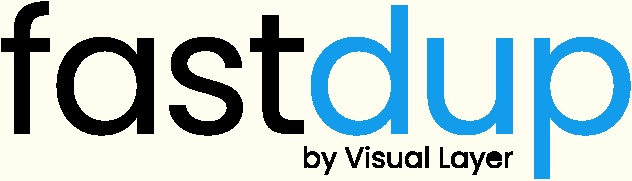
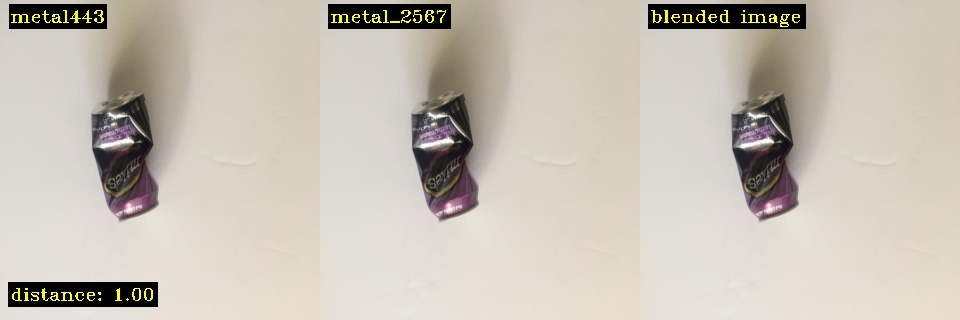
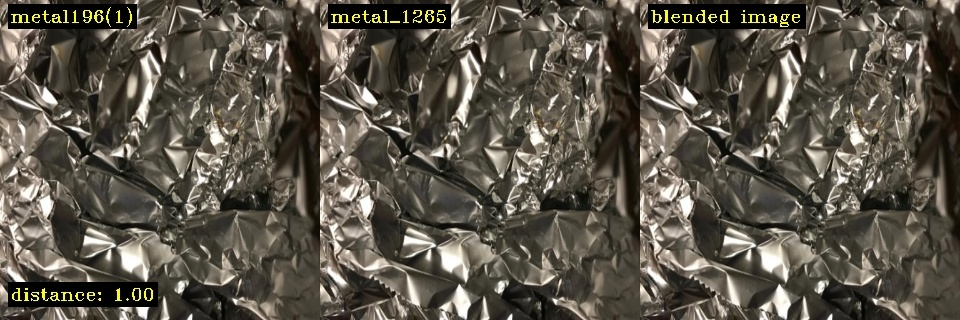
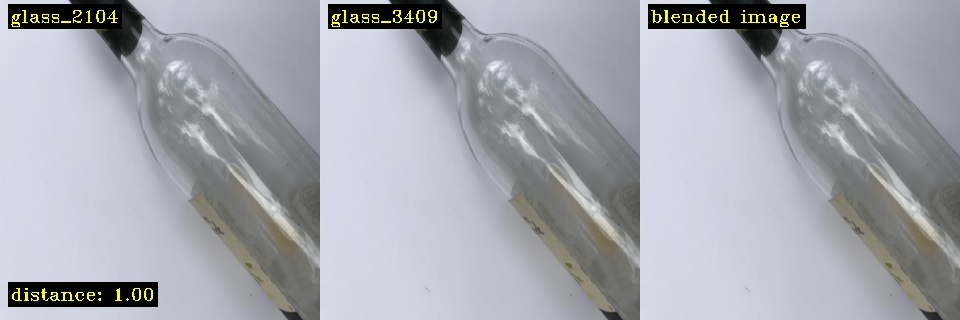
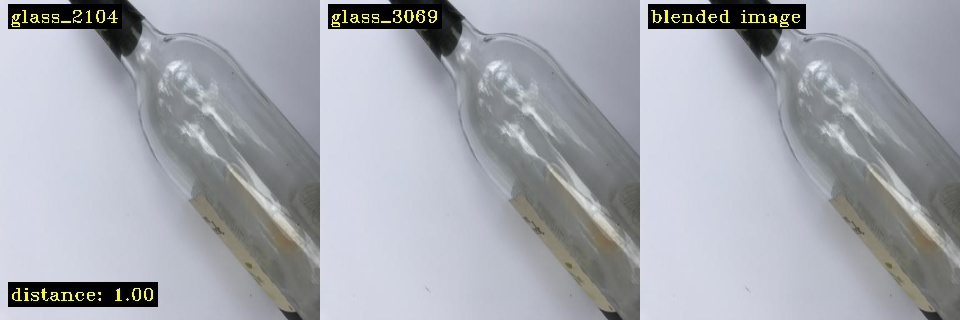
...
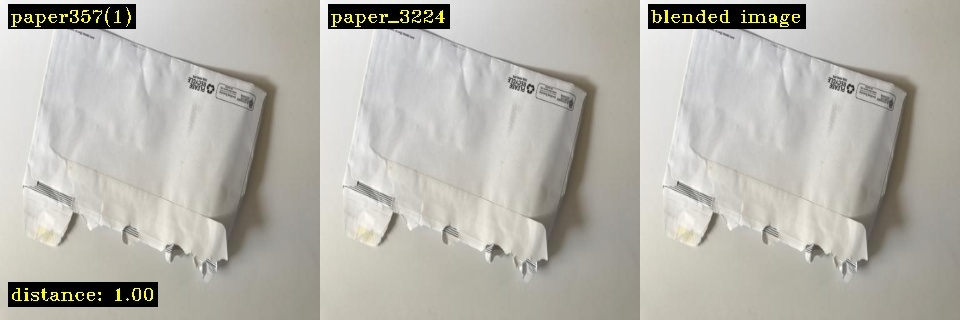
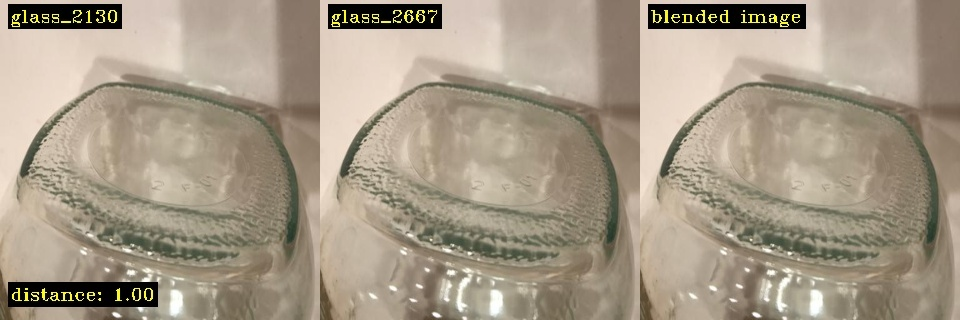
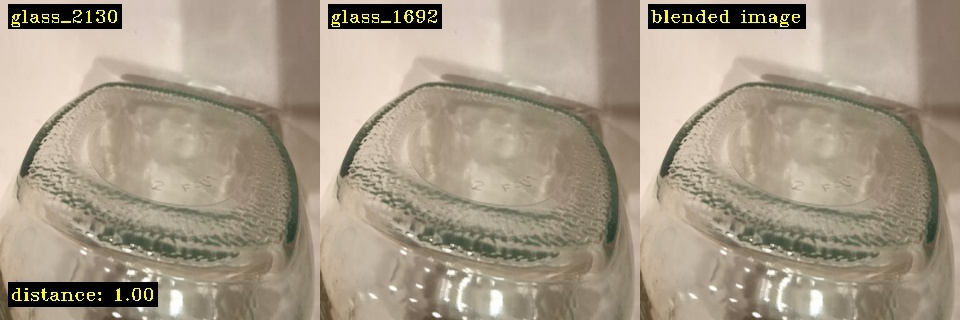
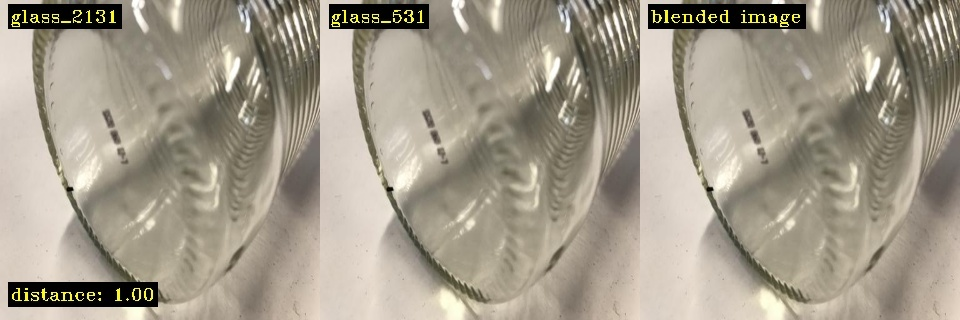
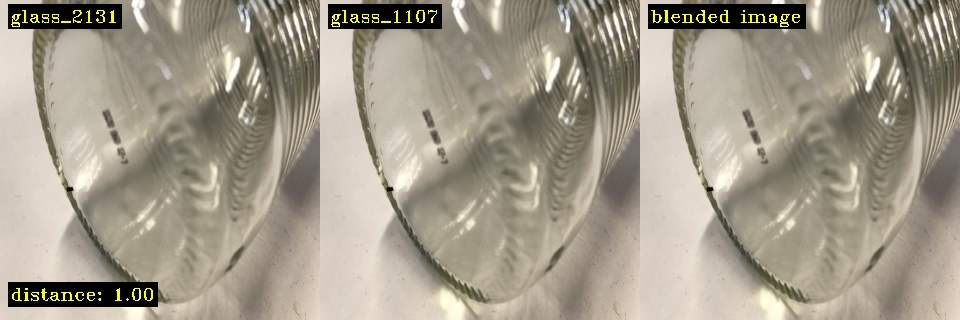

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored outliers visual view in  /root/datasets/CleanedDataset/galleries/outliers.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



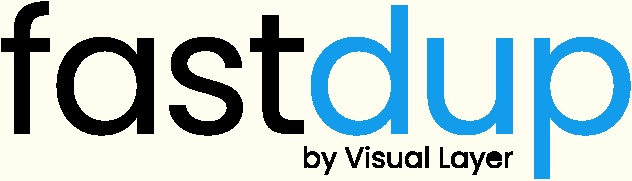
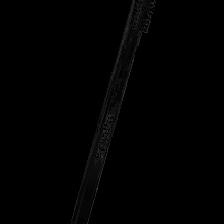
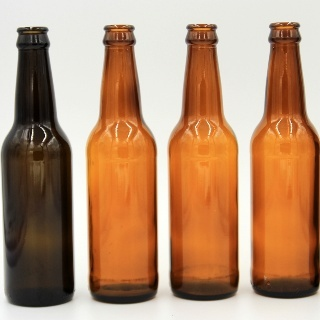
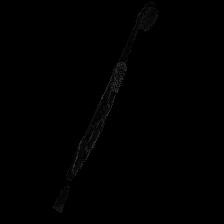
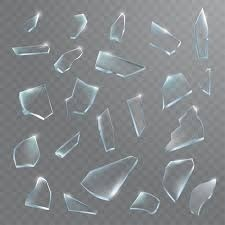
...
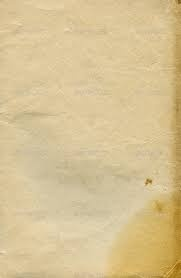
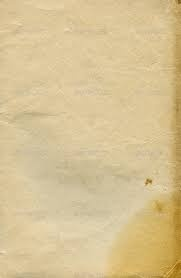
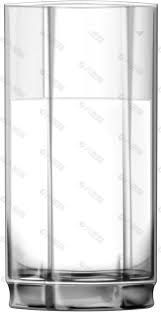
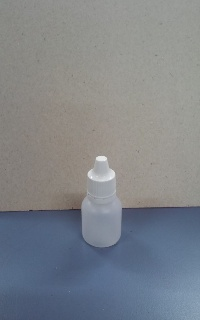
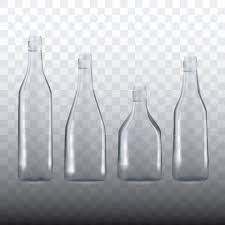

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Finished OK. Components are stored as image files /root/datasets/CleanedDataset/galleries/components_[index].jpg
Stored components visual view in  /root/datasets/CleanedDataset/galleries/components.html
Execution time in seconds 3.3
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



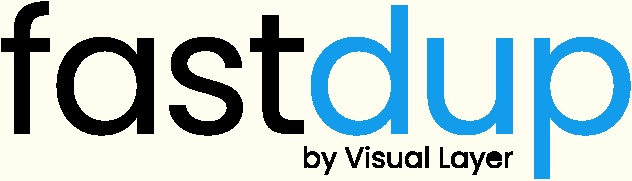
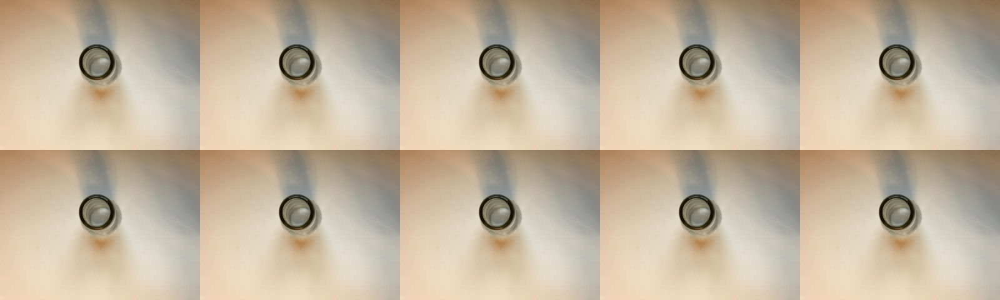
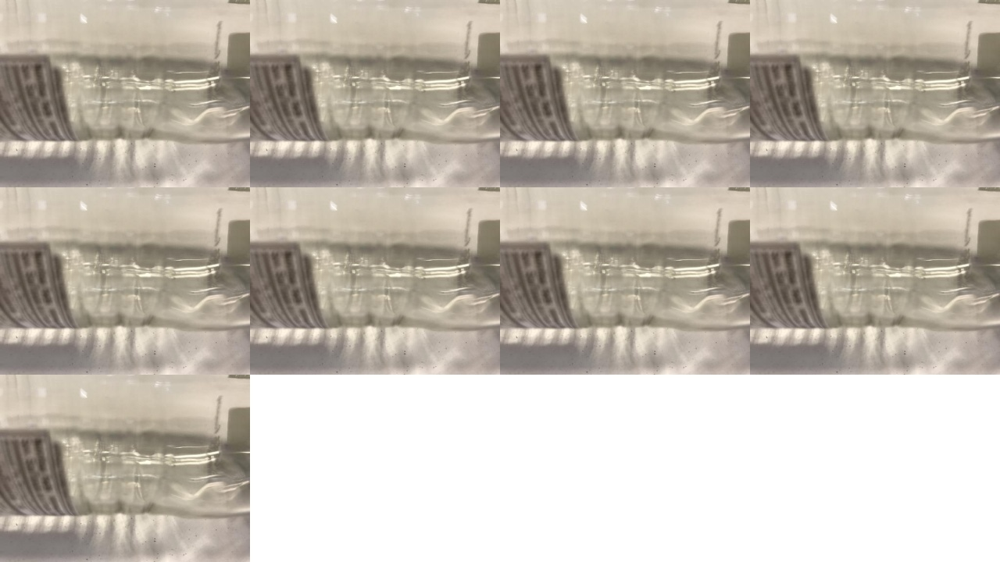
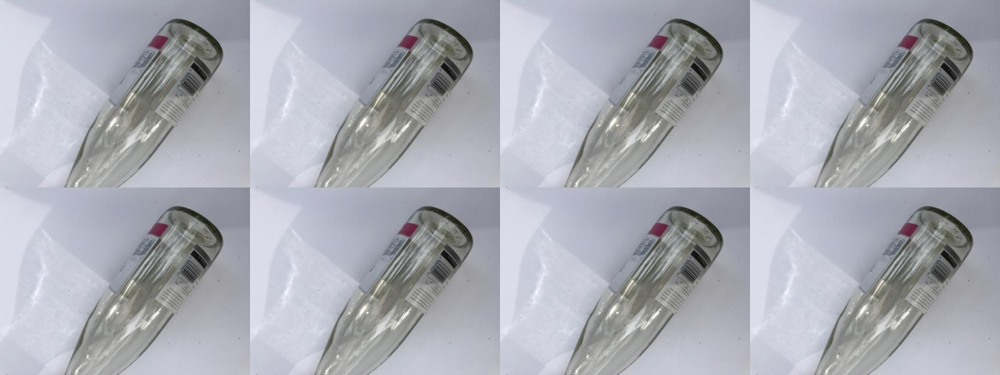
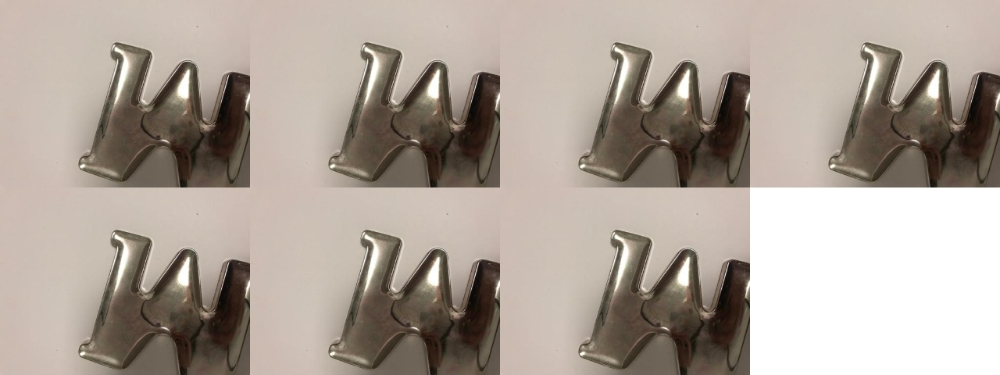
...
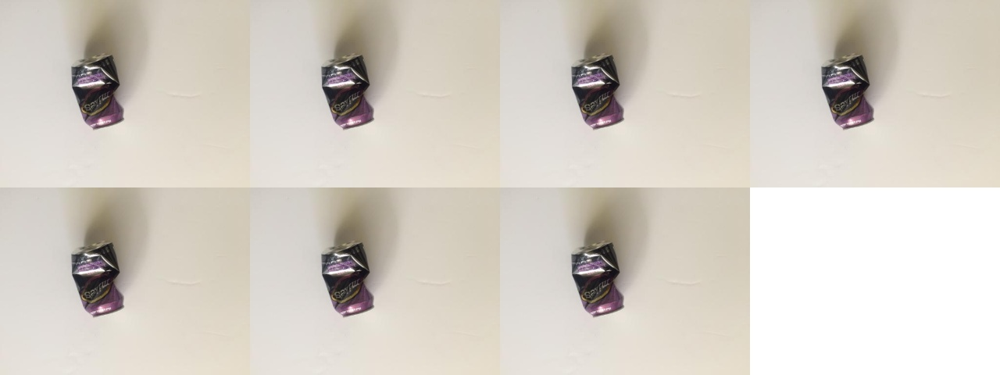
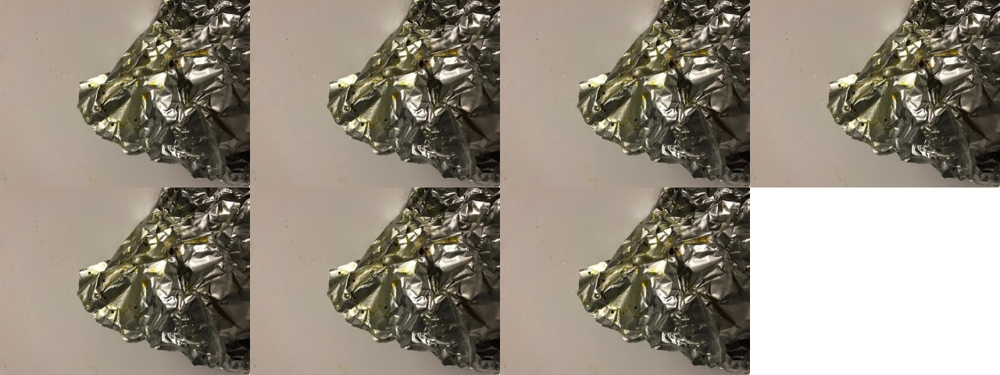
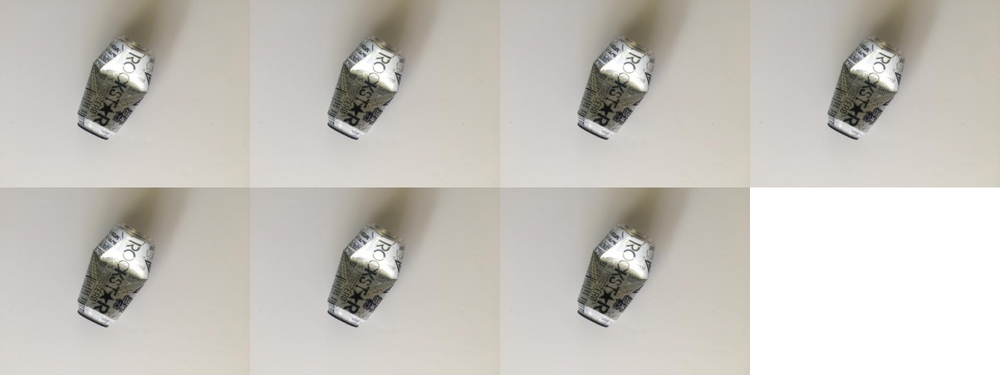
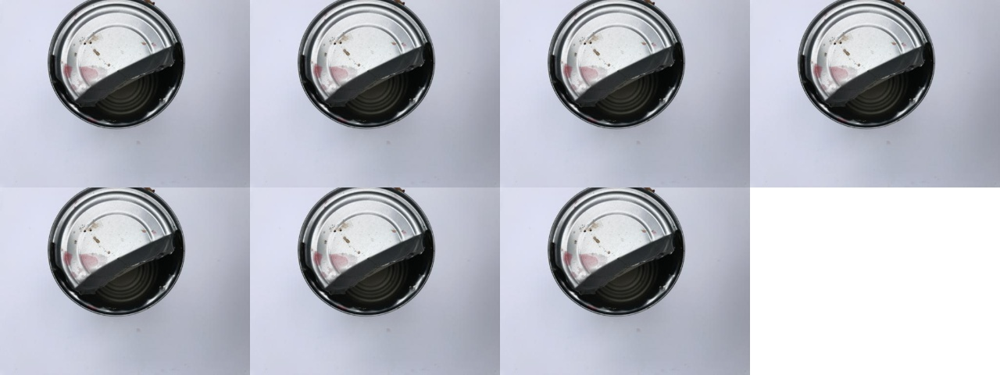
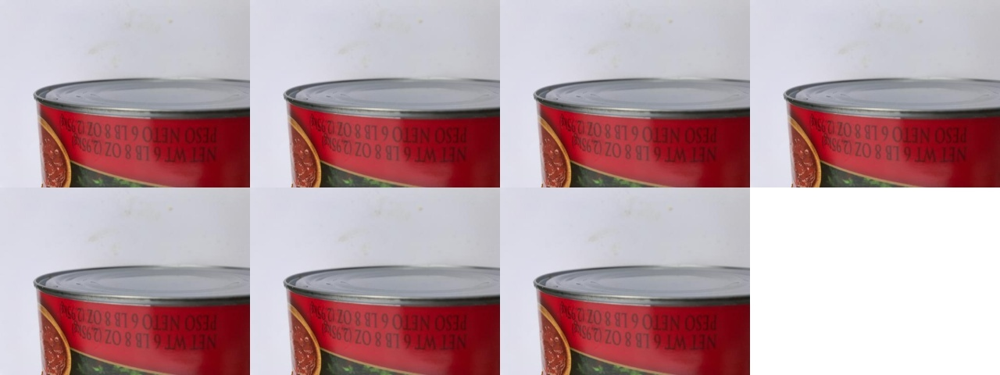

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored mean visual view in  /root/datasets/CleanedDataset/galleries/mean.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



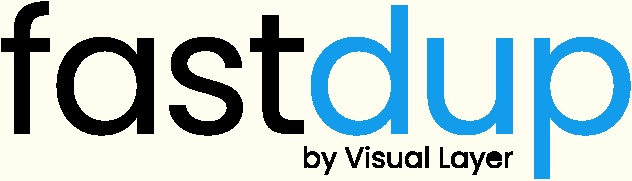
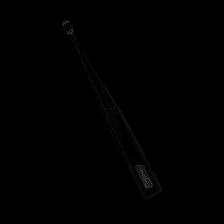
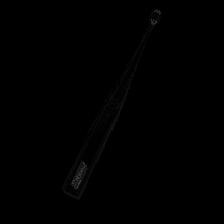
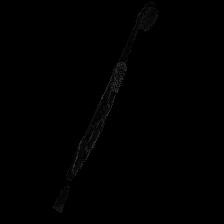
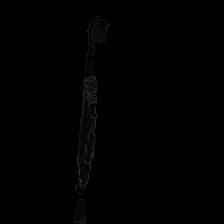
...
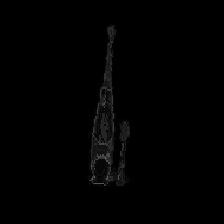
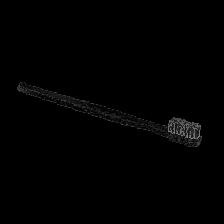
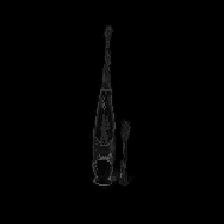
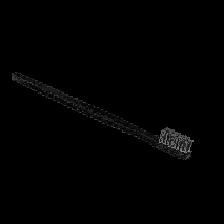
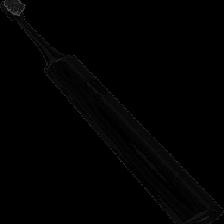

Generating gallery:   0%|          | 0/20 [00:00<?, ?it/s]

Stored similar images visual view in  /root/datasets/CleanedDataset/galleries/similarity.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



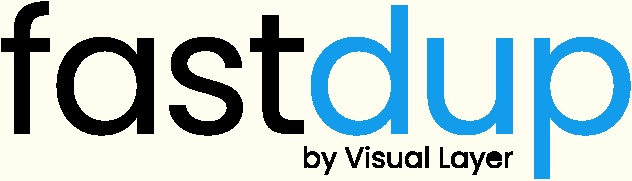
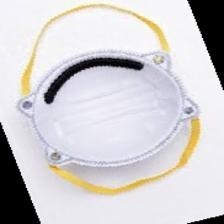
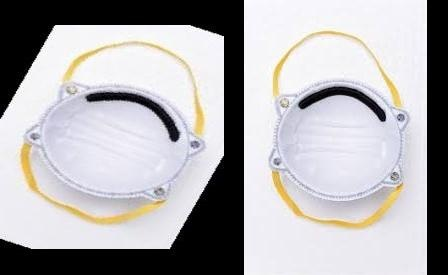
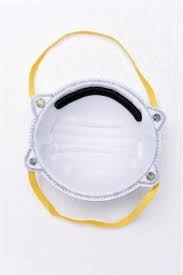
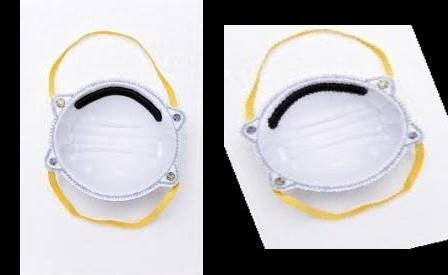
...
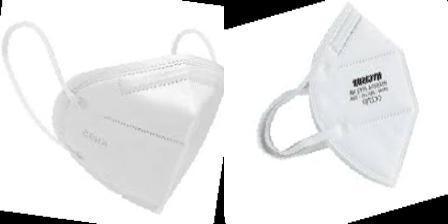
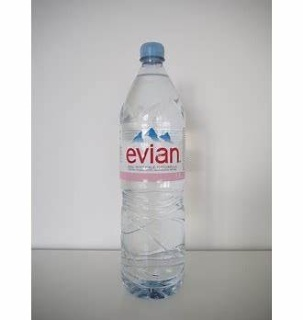
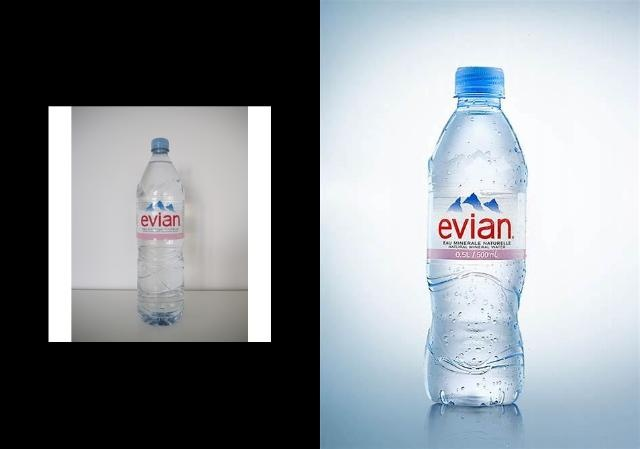
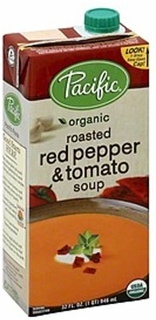
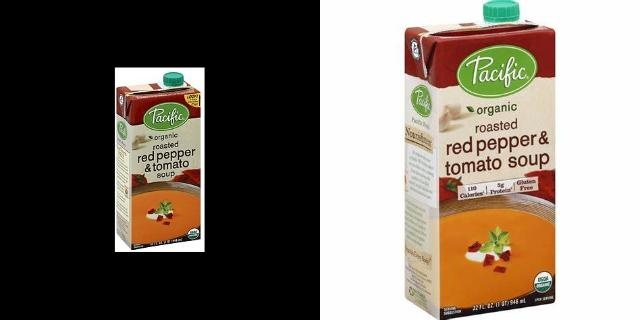

,from,to,distance
17046,/root/datasets/FinalDataset/trash/2_trash112.jpg,"[/root/datasets/FinalDataset/trash/trash_506.jpg, /root/datasets/FinalDataset/trash/2_trash_506.jpg]","[0.900001, 0.963369]"
19830,/root/datasets/FinalDataset/trash/trash_506.jpg,"[/root/datasets/FinalDataset/trash/2_trash112.jpg, /root/datasets/FinalDataset/trash/trash112.jpg]","[0.900001, 1.0]"
18458,/root/datasets/FinalDataset/trash/trash112.jpg,"[/root/datasets/FinalDataset/trash/2_trash112.jpg, /root/datasets/FinalDataset/trash/trash_506.jpg]","[0.900001, 1.0]"
18044,/root/datasets/FinalDataset/trash/2_trash_402.jpg,"[/root/datasets/FinalDataset/trash/2_trash_592.jpg, /root/datasets/FinalDataset/trash/2_trash598.jpg]","[0.900011, 0.924234]"
14732,/root/datasets/FinalDataset/plastic/plastic729.jpg,"[/root/datasets/FinalDataset/plastic/plastic_16.jpg, /root/datasets/FinalDataset/plastic/plastic_532.jpg]","[0.90003, 1.0]"
...,...,...,...
16480,/root/datasets/FinalDataset/plastic/plastic_411.jpg,"[/root/datasets/FinalDataset/plastic/plastic442(1).jpg, /root/datasets/FinalDataset/plastic/plastic442(1)(1).jpg, /root/datasets/FinalDataset/plastic/plastic_494.jpg]","[1.0, 1.0, 1.0]"
16479,/root/datasets/FinalDataset/plastic/plastic_41.jpg,"[/root/datasets/FinalDataset/plastic/plastic477(1)(1).jpg, /root/datasets/FinalDataset/plastic/plastic477(1).jpg, /root/datasets/FinalDataset/plastic/plastic_266.jpg]","[1.0, 1.0, 1.0]"
6494,/root/datasets/FinalDataset/metal/metal144(1)(1).jpg,"[/root/datasets/FinalDataset/metal/metal_985.jpg, /root/datasets/FinalDataset/metal/metal69.jpg, /root/datasets/FinalDataset/metal/metal144(1).jpg]","[1.0, 1.0, 1.0]"
6490,/root/datasets/FinalDataset/metal/metal142.jpg,"[/root/datasets/FinalDataset/metal/metal203(1).jpg, /root/datasets/FinalDataset/metal/metal_1232.jpg, /root/datasets/FinalDataset/metal/metal_1850.jpg]","[1.0, 1.0, 1.0]"


In [ ]:
fd.vis.duplicates_gallery()    # create a visual gallery of duplicates
fd.vis.outliers_gallery()      # create a visual gallery of anomalies
fd.vis.component_gallery()     # create a visualization of connected components
fd.vis.stats_gallery()         # create a visualization of images statistics (e.g. blur)
fd.vis.similarity_gallery()    # create a gallery of similar images

In [ ]:
from collections import defaultdict

classes = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
dataset_path = '/root/datasets/FinalDataset'
class_counts = defaultdict(int)

for className in classes:
    class_folder = os.path.join(dataset_path, className)
    if not os.path.isdir(class_folder):
        continue  # Skip if it's not a directory
    num_images = len([f for f in os.listdir(class_folder) if f.endswith(('.jpg', '.jpeg', '.png', '.ppm', '.bmp', '.pgm', '.tif', '.tiff', '.webp'))])
    class_counts[className] = num_images
    print(f"Number of images in class {className}: {num_images}")

Number of images in class cardboard: 4038
Number of images in class glass: 4067
Number of images in class metal: 3458
Number of images in class paper: 4369
Number of images in class plastic: 4371
Number of images in class trash: 3610


In [ ]:
broken_images = fd.invalid_instances()
print(broken_images)
list_of_broken_images = broken_images['filename'].to_list()
list_of_broken_images

duplicate_images = fd.similarity()
print(duplicate_images)
list_of_duplicate_images = duplicate_images['filename_from'].to_list()
list_of_duplicate_images

                                                  filename  index           error_code  is_valid  fd_index
16511  /root/datasets/FinalDataset/plastic/plastic_154.jpg  16511  ERROR_CORRUPT_IMAGE     False     16511
        from     to  distance                                        filename_from  index_x error_code_from  is_valid_from  fd_index_from                                          filename_to  index_y error_code_to  is_valid_to  fd_index_to
0      10895  10073  1.000000       /root/datasets/FinalDataset/metal/metal443.jpg    10895           VALID           True          10895     /root/datasets/FinalDataset/metal/metal_2567.jpg    10073         VALID         True        10073
1      10900   8537  1.000000       /root/datasets/FinalDataset/metal/metal448.jpg    10900           VALID           True          10900     /root/datasets/FinalDataset/metal/metal_1421.jpg     8537         VALID         True         8537
2      10900   9052  1.000000       /root/datasets/FinalDataset/me

['/root/datasets/FinalDataset/metal/metal443.jpg',
 '/root/datasets/FinalDataset/metal/metal448.jpg',
 '/root/datasets/FinalDataset/metal/metal448.jpg',
 '/root/datasets/FinalDataset/metal/metal448.jpg',
 '/root/datasets/FinalDataset/metal/metal447.jpg',
 '/root/datasets/FinalDataset/metal/metal447.jpg',
 '/root/datasets/FinalDataset/metal/metal447.jpg',
 '/root/datasets/FinalDataset/metal/metal446.jpg',
 '/root/datasets/FinalDataset/metal/metal445.jpg',
 '/root/datasets/FinalDataset/metal/metal444.jpg',
 '/root/datasets/FinalDataset/metal/metal444.jpg',
 '/root/datasets/FinalDataset/metal/metal444.jpg',
 '/root/datasets/FinalDataset/metal/metal449.jpg',
 '/root/datasets/FinalDataset/metal/metal443.jpg',
 '/root/datasets/FinalDataset/metal/metal441.jpg',
 '/root/datasets/FinalDataset/metal/metal441.jpg',
 '/root/datasets/FinalDataset/metal/metal441.jpg',
 '/root/datasets/FinalDataset/metal/metal_441.jpg',
 '/root/datasets/FinalDataset/metal/metal_441.jpg',
 '/root/datasets/FinalDataset

In [ ]:
connected_components_df , _ = fd.connected_components()
connected_components_df.head()

print(connected_components_df)

# a function to group connected components
def get_clusters(df, sort_by='count', min_count=2, ascending=False):
    # columns to aggregate
    agg_dict = {'filename': list, 'mean_distance': max, 'count': len}

    if 'label' in df.columns:
        agg_dict['label'] = list

    # filter by count
    df = df[df['count'] >= min_count]

    # group and aggregate columns
    grouped_df = df.groupby('component_id').agg(agg_dict)

    # sort
    grouped_df = grouped_df.sort_values(by=[sort_by], ascending=ascending)
    return grouped_df

clusters_df = get_clusters(connected_components_df)
clusters_df.head()

# First sample from each cluster that is kept
cluster_images_to_keep = []
list_of_duplicates = []

for cluster_file_list in clusters_df.filename:
    # keep first file, discard rest
    keep = cluster_file_list[0]
    discard = cluster_file_list[1:]

    cluster_images_to_keep.append(keep)
    list_of_duplicates.extend(discard)

print(f"Found {len(set(list_of_duplicates))} highly similar images to discard")

list_of_duplicates

       index  component_id  count  mean_distance  min_distance  max_distance                                                      filename error_code  is_valid  fd_index
0          1             1     24       1.000000      1.000000      1.000000  /root/datasets/FinalDataset/cardboard/cardboard100(1)(1).jpg      VALID      True         1
1          2             2      4       0.993143      0.993143      0.993143      /root/datasets/FinalDataset/cardboard/cardboard_1001.jpg      VALID      True         2
2          3             1     24       1.000000      1.000000      1.000000     /root/datasets/FinalDataset/cardboard/cardboard100(1).jpg      VALID      True         3
3          4             3     30       1.000000      1.000000      1.000000      /root/datasets/FinalDataset/cardboard/cardboard_1002.jpg      VALID      True         4
4          5             4      4       1.000000      1.000000      1.000000      /root/datasets/FinalDataset/cardboard/cardboard_1003.jpg      VALID 

<ipython-input-8-dacc5874546d>:18: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  grouped_df = df.groupby('component_id').agg(agg_dict)


['/root/datasets/FinalDataset/glass/glass_2231.jpg',
 '/root/datasets/FinalDataset/glass/glass_533.jpg',
 '/root/datasets/FinalDataset/metal/metal_1396.jpg',
 '/root/datasets/FinalDataset/metal/metal_1448.jpg',
 '/root/datasets/FinalDataset/metal/metal_2582.jpg',
 '/root/datasets/FinalDataset/metal/metal459.jpg',
 '/root/datasets/FinalDataset/metal/metal_478.jpg',
 '/root/datasets/FinalDataset/metal/metal91(1)(1).jpg',
 '/root/datasets/FinalDataset/metal/metal91(1).jpg',
 '/root/datasets/FinalDataset/glass/glass_1526.jpg',
 '/root/datasets/FinalDataset/glass/glass_4157.jpg',
 '/root/datasets/FinalDataset/plastic/plastic152(1)(1).jpg',
 '/root/datasets/FinalDataset/plastic/plastic152(1).jpg',
 '/root/datasets/FinalDataset/plastic/plastic_2272.jpg',
 '/root/datasets/FinalDataset/plastic/plastic_2623.jpg',
 '/root/datasets/FinalDataset/plastic/plastic556.jpg',
 '/root/datasets/FinalDataset/plastic/plastic_963.jpg',
 '/root/datasets/FinalDataset/glass/glass_580.jpg',
 '/root/datasets/Final

In [ ]:
for duplicate_file in list_of_duplicates:
  if os.path.exists(duplicate_file):
    os.remove(duplicate_file)

In [ ]:
from collections import defaultdict

print("Samples after removing duplicates:")
print()

classes = ['cardboard', 'glass', 'metal', 'paper', 'plastic', 'trash']
dataset_path = '/root/datasets/FinalDataset'
class_counts = defaultdict(int)
def num_sample_in_class():
  for className in classes:
      class_folder = os.path.join(dataset_path, className)
      if not os.path.isdir(class_folder):
          continue  # Skip if it's not a directory
      num_images = len([f for f in os.listdir(class_folder) if f.endswith(('.jpg', '.jpeg', '.png', '.ppm', '.bmp', '.pgm', '.tif', '.tiff', '.webp'))])
      class_counts[className] = num_images
      print(f"Number of images in class {className}: {num_images}")

num_sample_in_class()

Samples after removing duplicates:

Number of images in class cardboard: 1626
Number of images in class glass: 2734
Number of images in class metal: 1028
Number of images in class paper: 1765
Number of images in class plastic: 1741
Number of images in class trash: 2345


Generating gallery:   0%|          | 0/132 [00:00<?, ?it/s]

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_307.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard801.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_898.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_421.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard776.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_3173.jpg


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/plastic/plastic_307.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardboard/cardboard801.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardb

Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_916.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic825.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_576.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic570.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard586.jpg


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/paper/paper_916.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/plastic/plastic825.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardboard/car

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard464.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic500.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard789.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard777.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic645.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic637.jpg


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardboard/cardboard464.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/plastic/plastic500.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardbo

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard785.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_983.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_832.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_569.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard661.jpg


Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardboard/cardboard785.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/cardboard/cardboard_983.jpg /root/datasets/FinalDataset
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 496, in load_one_image_for_outliers
    assert img is not None, f"Failed to read image from {impath1} {input_dir}"
AssertionError: Failed to read image from /root/datasets/FinalDataset/c

Stored outliers visual view in  /root/datasets/CleanedDataset/galleries/outliers.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



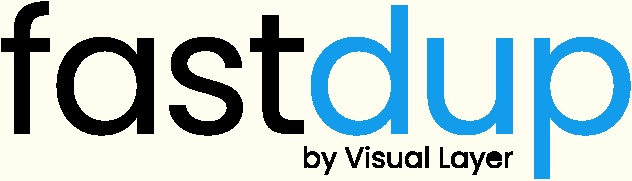
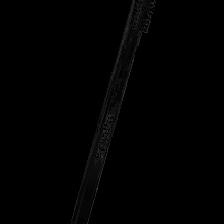
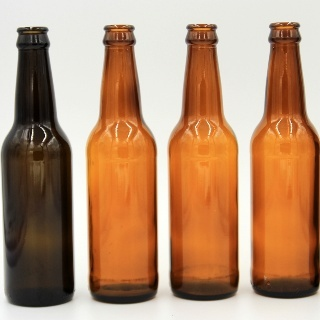
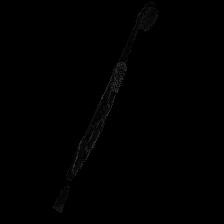
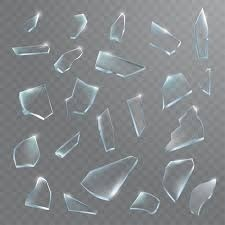
...
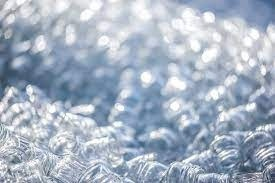
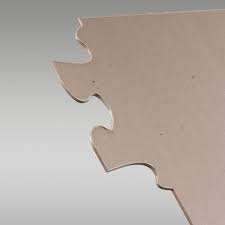
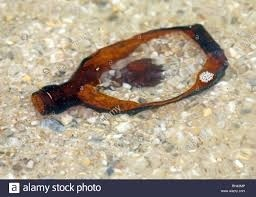
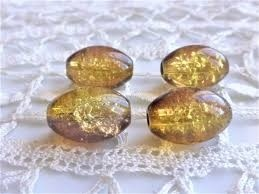
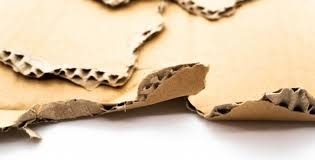

0

In [ ]:
fd.vis.outliers_gallery(num_images=132)

In [ ]:
outlier_df = fd.outliers()
outlier_df.head()
list_of_outliers = outlier_df[outlier_df.distance < 0.68].filename_outlier.tolist()
list_of_outliers
#plt.imshow(list_of_outliers[0])
print(len(list_of_outliers))
# for i in range(0, 25):
#   image = mpimg.imread(list_of_outliers[i])
#   plt.imshow(image)


132


Generating gallery:   0%|          | 0/49 [00:00<?, ?it/s]

Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash413.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash413.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash413.jpg orig filename /root/datasets/FinalDataset/trash/2_trash413.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash_828.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash_828.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash_828.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_828.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash_652.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash_652.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash_652.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_652.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash_75.jpg
Failed t

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash413.jpg orig filename /root/datasets/FinalDataset/trash/2_trash413.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash413.jpg orig filename /root/datasets/FinalDataset/trash/2_trash413.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Stored mean visual view in  /root/datasets/CleanedDataset/galleries/dark.html/mean.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
########################################################################################



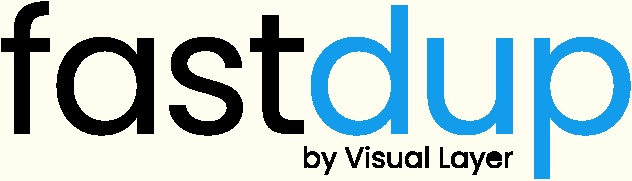
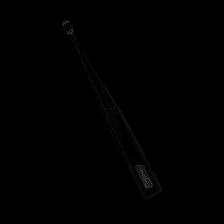
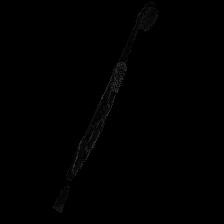
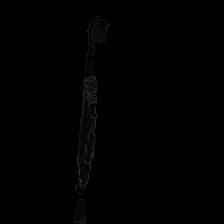
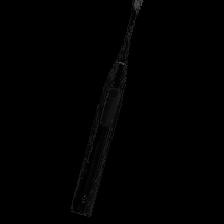
...
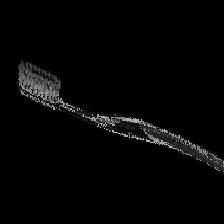
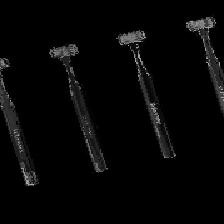
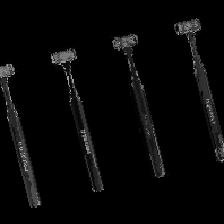
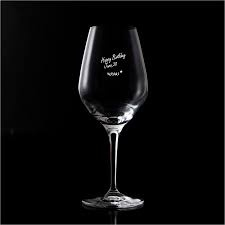
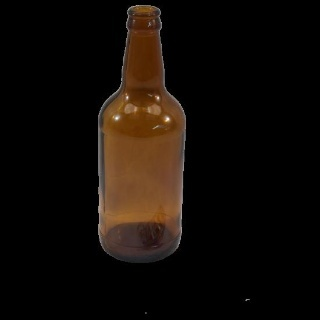

Generating gallery:   0%|          | 0/3222 [00:00<?, ?it/s]

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash630.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash630.jpg Failed to read image /root/datasets/FinalDataset/trash/trash630.jpg orig filename /root/datasets/FinalDataset/trash/trash630.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash413.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash413.jpg Failed to read image /root/datasets/FinalDataset/trash/trash413.jpg orig filename /root/datasets/FinalDataset/trash/trash413.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash437.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash437.jpg Failed to read image /root/datasets/FinalDataset/trash/trash437.jpg orig filename /root/datasets/FinalDataset/trash/trash437.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_407.jpg
Failed to generate viz for images /root/d

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash630.jpg orig filename /root/datasets/FinalDataset/trash/trash630.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash630.jpg orig filename /root/datasets/FinalDataset/trash/trash630.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

/root/datasets/FinalDataset/trash/trash_403.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_403.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_403.jpg orig filename /root/datasets/FinalDataset/trash/trash_403.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash598.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash598.jpg Failed to read image /root/datasets/FinalDataset/trash/trash598.jpg orig filename /root/datasets/FinalDataset/trash/trash598.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_662.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_662.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_662.jpg orig filename /root/datasets/FinalDataset/trash/trash_662.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash377.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/t

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_403.jpg orig filename /root/datasets/FinalDataset/trash/trash_403.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_403.jpg orig filename /root/datasets/FinalDataset/trash/trash_403.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_775.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_775.jpg orig filename /root/datasets/FinalDataset/trash/trash_775.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_548.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_548.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_548.jpg orig filename /root/datasets/FinalDataset/trash/trash_548.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash392.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash392.jpg Failed to read image /root/datasets/FinalDataset/trash/trash392.jpg orig filename /root/datasets/FinalDataset/trash/trash392.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash401.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash401.jpg Failed to read image /root/datasets/

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_775.jpg orig filename /root/datasets/FinalDataset/trash/trash_775.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_548.jpg orig filename /root/datasets/FinalDataset/trash/trash_548.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash567.jpg Failed to read image /root/datasets/FinalDataset/trash/trash567.jpg orig filename /root/datasets/FinalDataset/trash/trash567.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_761.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_761.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_761.jpg orig filename /root/datasets/FinalDataset/trash/trash_761.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_80.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_80.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_80.jpg orig filename /root/datasets/FinalDataset/trash/trash_80.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash454.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash454.jpg Failed to read image /root/datasets/Fin

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_623.jpg orig filename /root/datasets/FinalDataset/trash/trash_623.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash607.jpg orig filename /root/datasets/FinalDataset/trash/trash607.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash429.jpg Failed to read image /root/datasets/FinalDataset/trash/trash429.jpg orig filename /root/datasets/FinalDataset/trash/trash429.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_707.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_707.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_707.jpg orig filename /root/datasets/FinalDataset/trash/trash_707.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash523.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash523.jpg Failed to read image /root/datasets/FinalDataset/trash/trash523.jpg orig filename /root/datasets/FinalDataset/trash/trash523.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash535.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash535.jpg Failed to read image /root/datasets/Fin

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_695.jpg orig filename /root/datasets/FinalDataset/trash/trash_695.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_695.jpg orig filename /root/datasets/FinalDataset/trash/trash_695.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_828.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_828.jpg orig filename /root/datasets/FinalDataset/trash/trash_828.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash634.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash634.jpg Failed to read image /root/datasets/FinalDataset/trash/trash634.jpg orig filename /root/datasets/FinalDataset/trash/trash634.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash359.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash359.jpg Failed to read image /root/datasets/FinalDataset/trash/trash359.jpg orig filename /root/datasets/FinalDataset/trash/trash359.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_673.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_673.jpg Failed to read image /root/datasets/Fi

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_828.jpg orig filename /root/datasets/FinalDataset/trash/trash_828.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash634.jpg orig filename /root/datasets/FinalDataset/trash/trash634.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash586.jpg Failed to read image /root/datasets/FinalDataset/trash/trash586.jpg orig filename /root/datasets/FinalDataset/trash/trash586.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_73.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_73.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_73.jpg orig filename /root/datasets/FinalDataset/trash/trash_73.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash583.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash583.jpg Failed to read image /root/datasets/FinalDataset/trash/trash583.jpg orig filename /root/datasets/FinalDataset/trash/trash583.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash430.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash430.jpg Failed to read image /root/datasets/FinalDa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash333.jpg orig filename /root/datasets/FinalDataset/trash/trash333.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_62.jpg orig filename /root/datasets/FinalDataset/trash/trash_62.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash325.jpg Failed to read image /root/datasets/FinalDataset/trash/trash325.jpg orig filename /root/datasets/FinalDataset/trash/trash325.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash658.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash658.jpg Failed to read image /root/datasets/FinalDataset/trash/trash658.jpg orig filename /root/datasets/FinalDataset/trash/trash658.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_659.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_659.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_659.jpg orig filename /root/datasets/FinalDataset/trash/trash_659.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_652.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_652.jpg Failed to read image /root/datasets/F

  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash599.jpg orig filename /root/datasets/FinalDataset/trash/trash599.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash540.jpg orig filename /root/datasets/FinalDataset/trash/trash540.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionE

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash581.jpg Failed to read image /root/datasets/FinalDataset/trash/trash581.jpg orig filename /root/datasets/FinalDataset/trash/trash581.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_555.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_555.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_555.jpg orig filename /root/datasets/FinalDataset/trash/trash_555.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_717.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_717.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_717.jpg orig filename /root/datasets/FinalDataset/trash/trash_717.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash70.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash70.jpg Failed to read image /root/datasets/F

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_607.jpg orig filename /root/datasets/FinalDataset/trash/trash_607.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_607.jpg orig filename /root/datasets/FinalDataset/trash/trash_607.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash432.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash432.jpg Failed to read image /root/datasets/FinalDataset/trash/trash432.jpg orig filename /root/datasets/FinalDataset/trash/trash432.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash503.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash503.jpg Failed to read image /root/datasets/FinalDataset/trash/trash503.jpg orig filename /root/datasets/FinalDataset/trash/trash503.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash649.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash649.jpg Failed to read image /root/datasets/FinalDataset/trash/trash649.jpg orig filename /root/datasets/FinalDataset/trash/trash649.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_757.jpg
Failed to generate viz for images /root/d

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_757.jpg orig filename /root/datasets/FinalDataset/trash/trash_757.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_698.jpg orig filename /root/datasets/FinalDataset/trash/trash_698.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

 /root/datasets/FinalDataset/plastic/plastic733.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic733.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic733.jpg orig filename /root/datasets/FinalDataset/plastic/plastic733.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash82.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash82.jpg Failed to read image /root/datasets/FinalDataset/trash/trash82.jpg orig filename /root/datasets/FinalDataset/trash/trash82.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_764.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_764.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_764.jpg orig filename /root/datasets/FinalDataset/trash/trash_764.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic804.jpg
Failed to generate viz for images /root/datasets/FinalDa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_583.jpg orig filename /root/datasets/FinalDataset/trash/trash_583.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_583.jpg orig filename /root/datasets/FinalDataset/trash/trash_583.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_827.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_827.jpg orig filename /root/datasets/FinalDataset/trash/trash_827.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash562.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash562.jpg Failed to read image /root/datasets/FinalDataset/trash/trash562.jpg orig filename /root/datasets/FinalDataset/trash/trash562.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_672.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_672.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_672.jpg orig filename /root/datasets/FinalDataset/trash/trash_672.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_1661.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_1661.jpg Failed to read image /ro

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_827.jpg orig filename /root/datasets/FinalDataset/trash/trash_827.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash562.jpg orig filename /root/datasets/FinalDataset/trash/trash562.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_831.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_831.jpg orig filename /root/datasets/FinalDataset/trash/trash_831.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_79.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_79.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_79.jpg orig filename /root/datasets/FinalDataset/trash/trash_79.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic744.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic744.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic744.jpg orig filename /root/datasets/FinalDataset/plastic/plastic744.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic841.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic841.jpg Failed to read i

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash446.jpg orig filename /root/datasets/FinalDataset/trash/trash446.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash446.jpg orig filename /root/datasets/FinalDataset/trash/trash446.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_354.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_354.jpg orig filename /root/datasets/FinalDataset/trash/trash_354.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash509.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash509.jpg Failed to read image /root/datasets/FinalDataset/trash/trash509.jpg orig filename /root/datasets/FinalDataset/trash/trash509.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash666.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash666.jpg Failed to read image /root/datasets/FinalDataset/trash/trash666.jpg orig filename /root/datasets/FinalDataset/trash/trash666.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_449.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_449.jpg Failed to read image /root/dat

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_354.jpg orig filename /root/datasets/FinalDataset/trash/trash_354.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash509.jpg orig filename /root/datasets/FinalDataset/trash/trash509.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic824.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic824.jpg orig filename /root/datasets/FinalDataset/plastic/plastic824.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_809.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_809.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_809.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_809.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic743.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic743.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic743.jpg orig filename /root/datasets/FinalDataset/plastic/plastic743.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash618.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash618

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_3035.jpg orig filename /root/datasets/FinalDataset/glass/glass_3035.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash547.jpg orig filename /root/datasets/FinalDataset/trash/trash547.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic815.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic815.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic815.jpg orig filename /root/datasets/FinalDataset/plastic/plastic815.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash26.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash26.jpg Failed to read image /root/datasets/FinalDataset/trash/trash26.jpg orig filename /root/datasets/FinalDataset/trash/trash26.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_88.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_88.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_88.jpg orig filename /root/datasets/FinalDataset/trash/trash_88.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic823.jpg
Failed to generate viz for

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash541.jpg orig filename /root/datasets/FinalDataset/trash/trash541.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic764.jpg orig filename /root/datasets/FinalDataset/plastic/plastic764.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_624.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_624.jpg orig filename /root/datasets/FinalDataset/trash/trash_624.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_870.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_870.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_870.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_870.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_83.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_83.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_83.jpg orig filename /root/datasets/FinalDataset/trash/trash_83.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash411.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash411.jpg Failed to read image

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash637.jpg orig filename /root/datasets/FinalDataset/trash/trash637.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash637.jpg orig filename /root/datasets/FinalDataset/trash/trash637.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash322.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash322.jpg Failed to read image /root/datasets/FinalDataset/trash/trash322.jpg orig filename /root/datasets/FinalDataset/trash/trash322.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_96.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_96.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_96.jpg orig filename /root/datasets/FinalDataset/trash/trash_96.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_87.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_87.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_87.jpg orig filename /root/datasets/FinalDataset/trash/trash_87.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_800.jpg
Failed to generate viz for images /root/d

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_205.jpg orig filename /root/datasets/FinalDataset/trash/trash_205.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash62.jpg orig filename /root/datasets/FinalDataset/trash/trash62.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic814.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic814.jpg orig filename /root/datasets/FinalDataset/plastic/plastic814.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic697.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic697.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic697.jpg orig filename /root/datasets/FinalDataset/plastic/plastic697.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash561.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash561.jpg Failed to read image /root/datasets/FinalDataset/trash/trash561.jpg orig filename /root/datasets/FinalDataset/trash/trash561.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash272.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash272.jpg Failed to read 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_559.jpg orig filename /root/datasets/FinalDataset/trash/trash_559.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic639.jpg orig filename /root/datasets/FinalDataset/plastic/plastic639.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + "

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash97.jpg Failed to read image /root/datasets/FinalDataset/trash/trash97.jpg orig filename /root/datasets/FinalDataset/trash/trash97.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_745.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_745.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_745.jpg orig filename /root/datasets/FinalDataset/trash/trash_745.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash295.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash295.jpg Failed to read image /root/datasets/FinalDataset/trash/trash295.jpg orig filename /root/datasets/FinalDataset/trash/trash295.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash354.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash354.jpg Failed to read image /root/datasets/FinalD

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash475.jpg orig filename /root/datasets/FinalDataset/trash/trash475.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_689.jpg orig filename /root/datasets/FinalDataset/trash/trash_689.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_660.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_660.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_660.jpg orig filename /root/datasets/FinalDataset/trash/trash_660.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic708.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic708.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic708.jpg orig filename /root/datasets/FinalDataset/plastic/plastic708.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash518.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash518.jpg Failed to read image /root/datasets/FinalDataset/trash/trash518.jpg orig filename /root/datasets/FinalDataset/trash/trash518.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash648.jpg
Failed to generate viz

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_808.jpg orig filename /root/datasets/FinalDataset/trash/trash_808.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_808.jpg orig filename /root/datasets/FinalDataset/trash/trash_808.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_231.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_231.jpg orig filename /root/datasets/FinalDataset/trash/trash_231.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_699.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_699.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_699.jpg orig filename /root/datasets/FinalDataset/trash/trash_699.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic828.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic828.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic828.jpg orig filename /root/datasets/FinalDataset/plastic/plastic828.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_504.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_504.jpg Failed to read ima

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_231.jpg orig filename /root/datasets/FinalDataset/trash/trash_231.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_699.jpg orig filename /root/datasets/FinalDataset/trash/trash_699.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash372.jpg Failed to read image /root/datasets/FinalDataset/trash/trash372.jpg orig filename /root/datasets/FinalDataset/trash/trash372.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash344.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash344.jpg Failed to read image /root/datasets/FinalDataset/trash/trash344.jpg orig filename /root/datasets/FinalDataset/trash/trash344.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash502.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash502.jpg Failed to read image /root/datasets/FinalDataset/trash/trash502.jpg orig filename /root/datasets/FinalDataset/trash/trash502.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash71.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash71.jpg Failed to read image /root/datasets/FinalData

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_909.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_909.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_909.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_909.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_126.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_126.jpg orig filename /root/datasets/FinalDataset/trash/trash_126.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash169.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash169.jpg Failed to read image /root/datasets/FinalDataset/trash/trash169.jpg orig filename /root/datasets/FinalDataset/trash/trash169.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash281.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash281.jpg Failed to read image /root/datasets/FinalDataset/trash/trash281.jpg orig filename /root/datasets/FinalDataset/trash/trash281.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_539.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_539.jpg Failed to read image /

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_126.jpg orig filename /root/datasets/FinalDataset/trash/trash_126.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash169.jpg orig filename /root/datasets/FinalDataset/trash/trash169.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash189.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash189.jpg Failed to read image /root/datasets/FinalDataset/trash/trash189.jpg orig filename /root/datasets/FinalDataset/trash/trash189.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash597.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash597.jpg Failed to read image /root/datasets/FinalDataset/trash/trash597.jpg orig filename /root/datasets/FinalDataset/trash/trash597.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic714.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic714.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic714.jpg orig filename /root/datasets/FinalDataset/plastic/plastic714.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic805.jpg
Failed to generate viz

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_800.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_800.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic840.jpg orig filename /root/datasets/FinalDataset/plastic/plastic840.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash662.jpg Failed to read image /root/datasets/FinalDataset/trash/trash662.jpg orig filename /root/datasets/FinalDataset/trash/trash662.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_336.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_336.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_336.jpg orig filename /root/datasets/FinalDataset/trash/trash_336.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_406.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_406.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_406.jpg orig filename /root/datasets/FinalDataset/trash/trash_406.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic565.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic565.jpg Failed to read image /root/

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic653.jpg orig filename /root/datasets/FinalDataset/plastic/plastic653.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic653.jpg orig filename /root/datasets/FinalDataset/plastic/plastic653.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic729.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic729.jpg orig filename /root/datasets/FinalDataset/plastic/plastic729.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_59.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_59.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_59.jpg orig filename /root/datasets/FinalDataset/trash/trash_59.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_91.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_91.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_91.jpg orig filename /root/datasets/FinalDataset/trash/trash_91.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic563.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic563.jpg Failed to read image /r

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic729.jpg orig filename /root/datasets/FinalDataset/plastic/plastic729.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_59.jpg orig filename /root/datasets/FinalDataset/trash/trash_59.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash72.jpg Failed to read image /root/datasets/FinalDataset/trash/trash72.jpg orig filename /root/datasets/FinalDataset/trash/trash72.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_65.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_65.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_65.jpg orig filename /root/datasets/FinalDataset/trash/trash_65.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic839.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic839.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic839.jpg orig filename /root/datasets/FinalDataset/plastic/plastic839.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_639.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_639.jpg Failed to read image /root/d

AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic845.jpg orig filename /root/datasets/FinalDataset/plastic/plastic845.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_644.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_644.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_644.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_644.jpg
Traceback (most recent call last):
  File "/usr

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash520.jpg Failed to read image /root/datasets/FinalDataset/trash/trash520.jpg orig filename /root/datasets/FinalDataset/trash/trash520.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash604.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash604.jpg Failed to read image /root/datasets/FinalDataset/trash/trash604.jpg orig filename /root/datasets/FinalDataset/trash/trash604.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_265.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_265.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_265.jpg orig filename /root/datasets/FinalDataset/trash/trash_265.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_578.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_578.jpg Failed to read image /root/datasets/F

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_23.jpg orig filename /root/datasets/FinalDataset/trash/trash_23.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic813.jpg orig filename /root/datasets/FinalDataset/plastic/plastic813.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_584.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_584.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_584.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_584.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_594.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_594.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_594.jpg orig filename /root/datasets/FinalDataset/trash/trash_594.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_564.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_564.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_564.jpg orig filename /root/datasets/FinalDataset/trash/trash_564.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash656.jpg
Failed to gene

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_407.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_407.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash688.jpg orig filename /root/datasets/FinalDataset/trash/trash688.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + file

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_77.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_77.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_77.jpg orig filename /root/datasets/FinalDataset/trash/trash_77.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_13.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_13.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_13.jpg orig filename /root/datasets/FinalDataset/trash/trash_13.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_682.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_682.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_682.jpg orig filename /root/datasets/FinalDataset/trash/trash_682.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash224.jpg
Failed to generate viz for images /roo

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic820.jpg orig filename /root/datasets/FinalDataset/plastic/plastic820.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic820.jpg orig filename /root/datasets/FinalDataset/plastic/plastic820.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_854.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_854.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_854.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash690.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash690.jpg Failed to read image /root/datasets/FinalDataset/trash/trash690.jpg orig filename /root/datasets/FinalDataset/trash/trash690.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_643.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_643.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_643.jpg orig filename /root/datasets/FinalDataset/trash/trash_643.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_577.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_577.jpg Failed to read image /

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_815.jpg orig filename /root/datasets/FinalDataset/trash/trash_815.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_815.jpg orig filename /root/datasets/FinalDataset/trash/trash_815.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_787.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_787.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_787.jpg orig filename /root/datasets/FinalDataset/trash/trash_787.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_647.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_647.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_647.jpg orig filename /root/datasets/FinalDataset/trash/trash_647.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_587.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_587.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_587.jpg orig filename /root/datasets/FinalDataset/trash/trash_587.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_513.jpg
Failed to generate viz for im

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_303.jpg orig filename /root/datasets/FinalDataset/trash/trash_303.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_361.jpg orig filename /root/datasets/FinalDataset/trash/trash_361.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4368.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_4368.jpg orig filename /root/datasets/FinalDataset/glass/glass_4368.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic544.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic544.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic544.jpg orig filename /root/datasets/FinalDataset/plastic/plastic544.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_760.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_760.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_760.jpg orig filename /root/datasets/FinalDataset/trash/trash_760.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic830.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic830.jpg Failed to

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash57.jpg orig filename /root/datasets/FinalDataset/trash/trash57.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_20.jpg orig filename /root/datasets/FinalDataset/trash/trash_20.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filena

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash527.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash527.jpg Failed to read image /root/datasets/FinalDataset/trash/trash527.jpg orig filename /root/datasets/FinalDataset/trash/trash527.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_351.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_351.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_351.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_351.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal662.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal662.jpg Failed to read image /root/datasets/FinalDataset/metal/metal662.jpg orig filename /root/datasets/FinalDataset/metal/metal662.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2296.jpg
Failed to ge

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_509.jpg orig filename /root/datasets/FinalDataset/trash/trash_509.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_509.jpg orig filename /root/datasets/FinalDataset/trash/trash_509.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_830.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_830.jpg orig filename /root/datasets/FinalDataset/trash/trash_830.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_753.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_753.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_753.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_753.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash75.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash75.jpg Failed to read image /root/datasets/FinalDataset/trash/trash75.jpg orig filename /root/datasets/FinalDataset/trash/trash75.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic677.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic677.jpg Failed to read i

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_830.jpg orig filename /root/datasets/FinalDataset/trash/trash_830.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_753.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_753.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename +

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_687.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_687.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_687.jpg orig filename /root/datasets/FinalDataset/trash/trash_687.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_796.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_796.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_796.jpg orig filename /root/datasets/FinalDataset/trash/trash_796.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_220.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_220.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_220.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_220.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_9

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_687.jpg orig filename /root/datasets/FinalDataset/trash/trash_687.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_796.jpg orig filename /root/datasets/FinalDataset/trash/trash_796.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic812.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic812.jpg orig filename /root/datasets/FinalDataset/plastic/plastic812.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal692.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal692.jpg Failed to read image /root/datasets/FinalDataset/metal/metal692.jpg orig filename /root/datasets/FinalDataset/metal/metal692.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic695.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic695.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic695.jpg orig filename /root/datasets/FinalDataset/plastic/plastic695.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic741.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic741.jpg Failed 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic812.jpg orig filename /root/datasets/FinalDataset/plastic/plastic812.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal692.jpg orig filename /root/datasets/FinalDataset/metal/metal692.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash508.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash508.jpg orig filename /root/datasets/FinalDataset/trash/2_trash508.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_704.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_704.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_704.jpg orig filename /root/datasets/FinalDataset/trash/trash_704.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic720.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic720.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic720.jpg orig filename /root/datasets/FinalDataset/plastic/plastic720.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_2711.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_2711.jpg Faile

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic727.jpg orig filename /root/datasets/FinalDataset/plastic/plastic727.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash92.jpg orig filename /root/datasets/FinalDataset/trash/trash92.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " ori

Failed to read image from img_path /root/datasets/FinalDataset/metal/metal693.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal693.jpg Failed to read image /root/datasets/FinalDataset/metal/metal693.jpg orig filename /root/datasets/FinalDataset/metal/metal693.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_56.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_56.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_56.jpg orig filename /root/datasets/FinalDataset/trash/trash_56.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash312.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash312.jpg Failed to read image /root/datasets/FinalDataset/trash/trash312.jpg orig filename /root/datasets/FinalDataset/trash/trash312.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_811.jpg
Failed to generate viz for images /root/d

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal693.jpg orig filename /root/datasets/FinalDataset/metal/metal693.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal693.jpg orig filename /root/datasets/FinalDataset/metal/metal693.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_1593.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_1593.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_1593.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1593.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic696.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic696.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic696.jpg orig filename /root/datasets/FinalDataset/plastic/plastic696.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash655.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash655.jpg Failed to read image /root/datasets/FinalDataset/trash/trash655.jpg orig filename /root/datasets/FinalDataset/trash/trash655.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash216.jpg
Fa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_1593.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1593.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_1593.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1593.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_390.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_390.jpg orig filename /root/datasets/FinalDataset/trash/trash_390.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal676.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal676.jpg Failed to read image /root/datasets/FinalDataset/metal/metal676.jpg orig filename /root/datasets/FinalDataset/metal/metal676.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_975.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_975.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_975.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_975.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic848.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic848.jpg Failed to re

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_390.jpg orig filename /root/datasets/FinalDataset/trash/trash_390.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal676.jpg orig filename /root/datasets/FinalDataset/metal/metal676.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_207.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_207.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_207.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_674.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_674.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_674.jpg orig filename /root/datasets/FinalDataset/trash/trash_674.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_731.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_731.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_731.jpg orig filename /root/datasets/FinalDataset/trash/trash_731.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_194.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_194.jpg Failed

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_194.jpg orig filename /root/datasets/FinalDataset/trash/trash_194.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_194.jpg orig filename /root/datasets/FinalDataset/trash/trash_194.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal702.jpg Failed to read image /root/datasets/FinalDataset/metal/metal702.jpg orig filename /root/datasets/FinalDataset/metal/metal702.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash74.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash74.jpg Failed to read image /root/datasets/FinalDataset/trash/trash74.jpg orig filename /root/datasets/FinalDataset/trash/trash74.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_2418.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_2418.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_2418.jpg orig filename /root/datasets/FinalDataset/glass/glass_2418.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash314.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash314.jpg Failed to read image /root/datasets/Fin

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_971.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_971.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_971.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_971.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_971.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_971.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_971.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic505.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic505.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic505.jpg orig filename /root/datasets/FinalDataset/plastic/plastic505.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard561.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard561.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard561.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard561.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_83.jpg
Failed to generate viz for images /root/datasets/FinalDat

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal656.jpg orig filename /root/datasets/FinalDataset/metal/metal656.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal656.jpg orig filename /root/datasets/FinalDataset/metal/metal656.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_903.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_903.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_903.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_903.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal643.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal643.jpg Failed to read image /root/datasets/FinalDataset/metal/metal643.jpg orig filename /root/datasets/FinalDataset/metal/metal643.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic748.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic748.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic748.jpg orig filename /root/datasets/FinalDataset/plastic/plastic748.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_66.jpg
Failed

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_903.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_903.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_903.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_903.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash80.jpg Failed to read image /root/datasets/FinalDataset/trash/trash80.jpg orig filename /root/datasets/FinalDataset/trash/trash80.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_844.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_844.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_844.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_844.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_793.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_793.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_793.jpg orig filename /root/datasets/FinalDataset/trash/trash_793.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic572.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic572.jpg Failed to read

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash594.jpg orig filename /root/datasets/FinalDataset/trash/trash594.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash594.jpg orig filename /root/datasets/FinalDataset/trash/trash594.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash594.jpg Failed to read image /root/datasets/FinalDataset/trash/trash594.jpg orig filename /root/datasets/FinalDataset/trash/trash594.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_551.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_551.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_551.jpg orig filename /root/datasets/FinalDataset/trash/trash_551.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_350.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_350.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_350.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_350.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash569.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash569.jpg Fai

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash151.jpg orig filename /root/datasets/FinalDataset/trash/trash151.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash304.jpg orig filename /root/datasets/FinalDataset/trash/trash304.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4653.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4653.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_4653.jpg orig filename /root/datasets/FinalDataset/glass/glass_4653.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash633.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash633.jpg Failed to read image /root/datasets/FinalDataset/trash/trash633.jpg orig filename /root/datasets/FinalDataset/trash/trash633.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plast

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2248.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed 

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_670.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_670.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_670.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_670.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2328.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2328.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2328.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2328.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard515.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard515.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard515.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard515.jpg
Failed to read i

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_670.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_670.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_670.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_670.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to r

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_306.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_306.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_306.jpg orig filename /root/datasets/FinalDataset/trash/trash_306.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_820.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_820.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_820.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_820.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash620.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash620.jpg Failed to read image /root/datasets/FinalDataset/trash/trash620.jpg orig filename /root/datasets/FinalDataset/trash/trash620.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2867.jpg
Failed to genera

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_306.jpg orig filename /root/datasets/FinalDataset/trash/trash_306.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_306.jpg orig filename /root/datasets/FinalDataset/trash/trash_306.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic676.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic676.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic676.jpg orig filename /root/datasets/FinalDataset/plastic/plastic676.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_206.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_206.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_206.jpg orig filename /root/datasets/FinalDataset/trash/trash_206.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_596.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_596.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_596.jpg orig filename /root/datasets/FinalDataset/trash/trash_596.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash612.jpg
Failed to generate

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic676.jpg orig filename /root/datasets/FinalDataset/plastic/plastic676.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic676.jpg orig filename /root/datasets/FinalDataset/plastic/plastic676.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash291.jpg Failed to read image /root/datasets/FinalDataset/trash/trash291.jpg orig filename /root/datasets/FinalDataset/trash/trash291.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_424.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_424.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_424.jpg orig filename /root/datasets/FinalDataset/trash/trash_424.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_2237.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_2237.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_2237.jpg orig filename /root/datasets/FinalDataset/glass/glass_2237.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2194.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2194.jpg Failed to r

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_605.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_605.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic662.jpg orig filename /root/datasets/FinalDataset/plastic/plastic662.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_520.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_520.jpg orig filename /root/datasets/FinalDataset/trash/trash_520.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash497.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash497.jpg Failed to read image /root/datasets/FinalDataset/trash/trash497.jpg orig filename /root/datasets/FinalDataset/trash/trash497.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_494.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_494.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_494.jpg orig filename /root/datasets/FinalDataset/trash/trash_494.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_948.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_948.jpg Failed to read ima

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_520.jpg orig filename /root/datasets/FinalDataset/trash/trash_520.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash497.jpg orig filename /root/datasets/FinalDataset/trash/trash497.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_746.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_746.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_746.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_746.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_346.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_346.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_346.jpg orig filename /root/datasets/FinalDataset/trash/trash_346.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash165.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash165.jpg Failed to read image /root/datasets/FinalDataset/trash/trash165.jpg orig filename /root/datasets/FinalDataset/trash/trash165.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_736.jpg
F

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_746.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_746.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_746.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_746.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to r

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_743.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_743.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_743.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_743.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_373.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_373.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_373.jpg orig filename /root/datasets/FinalDataset/trash/trash_373.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash348.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash348.jpg Failed to read image /root/datasets/FinalDataset/trash/trash348.jpg orig filename /root/datasets/FinalDataset/trash/trash348.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal445.jpg
Failed to generate

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_743.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_743.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_373.jpg orig filename /root/datasets/FinalDataset/trash/trash_373.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename +

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard686.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard686.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard686.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard686.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_723.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_723.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_723.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_723.jpg
Failed to read i

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard686.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard686.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2244.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to r

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal728.jpg Failed to read image /root/datasets/FinalDataset/metal/metal728.jpg orig filename /root/datasets/FinalDataset/metal/metal728.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_398.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_398.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_398.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_398.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1704.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1704.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1704.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1704.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_670.jpg
Failed to generate viz for images /root/dataset

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_398.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_398.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_398.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_398.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to r

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_1156.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_1156.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_1156.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1156.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_650.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_650.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_650.jpg orig filename /root/datasets/FinalDataset/trash/trash_650.jpg
Failed to read image from img_path /root/datasets/FinalD

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2032.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed 

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard589.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard589.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard589.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard589.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1648.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1648.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1648.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1648.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_781.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_781.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_781.jpg orig filename /root/datasets/FinalDataset/trash/trash_781.jpg
Failed to read image from img_path /root/dataset

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard589.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard589.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard589.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard589.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read 

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic832.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic832.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic832.jpg orig filename /root/datasets/FinalDataset/plastic/plastic832.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard502.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard502.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard502.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard502.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal457.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal457.jpg Failed to read image /root/datasets/FinalDataset/metal/metal457.jpg orig filename /root/datasets/FinalDataset/metal/metal457.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plast

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic832.jpg orig filename /root/datasets/FinalDataset/plastic/plastic832.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic832.jpg orig filename /root/datasets/FinalDataset/plastic/plastic832.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash394.jpg Failed to read image /root/datasets/FinalDataset/trash/trash394.jpg orig filename /root/datasets/FinalDataset/trash/trash394.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic601.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic601.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic601.jpg orig filename /root/datasets/FinalDataset/plastic/plastic601.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_637.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_637.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_637.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_637.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_788.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/tra

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash394.jpg orig filename /root/datasets/FinalDataset/trash/trash394.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic601.jpg orig filename /root/datasets/FinalDataset/plastic/plastic601.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash_13.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash_13.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash_13.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_13.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_450.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_450.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_450.jpg orig filename /root/datasets/FinalDataset/trash/trash_450.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash602.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash602.jpg Failed to read image /root/datasets/FinalDataset/trash/trash602.jpg orig filename /root/datasets/FinalDataset/trash/trash602.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_196.jpg
Failed to generate viz for im

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash_13.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_13.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash_13.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_13.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic691.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic691.jpg orig filename /root/datasets/FinalDataset/plastic/plastic691.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash349.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash349.jpg Failed to read image /root/datasets/FinalDataset/trash/trash349.jpg orig filename /root/datasets/FinalDataset/trash/trash349.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_429.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_429.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_429.jpg orig filename /root/datasets/FinalDataset/trash/trash_429.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard688.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard688.jpg Failed to r

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash349.jpg orig filename /root/datasets/FinalDataset/trash/trash349.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash349.jpg orig filename /root/datasets/FinalDataset/trash/trash349.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash39.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash39.jpg Failed to read image /root/datasets/FinalDataset/trash/trash39.jpg orig filename /root/datasets/FinalDataset/trash/trash39.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_786.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_786.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_786.jpg orig filename /root/datasets/FinalDataset/trash/trash_786.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal666.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal666.jpg Failed to read image /root/datasets/FinalDataset/metal/metal666.jpg orig filename /root/datasets/FinalDataset/metal/metal666.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_865.jpg
Failed to generate viz for images

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash39.jpg orig filename /root/datasets/FinalDataset/trash/trash39.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_786.jpg orig filename /root/datasets/FinalDataset/trash/trash_786.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_94.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_94.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_94.jpg orig filename /root/datasets/FinalDataset/trash/trash_94.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash257.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash257.jpg Failed to read image /root/datasets/FinalDataset/trash/trash257.jpg orig filename /root/datasets/FinalDataset/trash/trash257.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash486.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash486.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash486.jpg orig filename /root/datasets/FinalDataset/trash/2_trash486.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_545.jpg
Failed to generate viz for images

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_94.jpg orig filename /root/datasets/FinalDataset/trash/trash_94.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash257.jpg orig filename /root/datasets/FinalDataset/trash/trash257.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal738.jpg Failed to read image /root/datasets/FinalDataset/metal/metal738.jpg orig filename /root/datasets/FinalDataset/metal/metal738.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_387.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_387.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_387.jpg orig filename /root/datasets/FinalDataset/trash/trash_387.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_738.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_738.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_738.jpg orig filename /root/datasets/FinalDataset/trash/trash_738.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard533.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard533.jpg Failed to read imag

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal634.jpg orig filename /root/datasets/FinalDataset/metal/metal634.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal634.jpg orig filename /root/datasets/FinalDataset/metal/metal634.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash373.jpg Failed to read image /root/datasets/FinalDataset/trash/trash373.jpg orig filename /root/datasets/FinalDataset/trash/trash373.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard776.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard776.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard776.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard776.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_479.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_479.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_479.jpg orig filename /root/datasets/FinalDataset/trash/trash_479.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_744.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_744.jpg Faile

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash332.jpg orig filename /root/datasets/FinalDataset/trash/trash332.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash332.jpg orig filename /root/datasets/FinalDataset/trash/trash332.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic671.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic671.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic671.jpg orig filename /root/datasets/FinalDataset/plastic/plastic671.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard641.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard641.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard641.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard641.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_955.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_955.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_955.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_955.jpg
Failed to read image from img_path /root

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic671.jpg orig filename /root/datasets/FinalDataset/plastic/plastic671.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic671.jpg orig filename /root/datasets/FinalDataset/plastic/plastic671.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to read image from img_path /root/datasets/FinalDataset/metal/metal752.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal752.jpg Failed to read image /root/datasets/FinalDataset/metal/metal752.jpg orig filename /root/datasets/FinalDataset/metal/metal752.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal764.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal764.jpg Failed to read image /root/datasets/FinalDataset/metal/metal764.jpg orig filename /root/datasets/FinalDataset/metal/metal764.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_636.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_636.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_636.jpg orig filename /root/datasets/FinalDataset/trash/trash_636.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic658.jpg
Failed to generate viz for images 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal752.jpg orig filename /root/datasets/FinalDataset/metal/metal752.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal752.jpg orig filename /root/datasets/FinalDataset/metal/metal752.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_729.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_729.jpg orig filename /root/datasets/FinalDataset/trash/trash_729.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal596.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal596.jpg Failed to read image /root/datasets/FinalDataset/metal/metal596.jpg orig filename /root/datasets/FinalDataset/metal/metal596.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4473.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4473.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_4473.jpg orig filename /root/datasets/FinalDataset/glass/glass_4473.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal732.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal732.jpg Failed to read image /root/datas

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_729.jpg orig filename /root/datasets/FinalDataset/trash/trash_729.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal596.jpg orig filename /root/datasets/FinalDataset/metal/metal596.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig fi

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_766.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_766.jpg orig filename /root/datasets/FinalDataset/trash/trash_766.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_794.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_794.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_794.jpg orig filename /root/datasets/FinalDataset/trash/trash_794.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash530.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash530.jpg Failed to read image /root/datasets/FinalDataset/trash/trash530.jpg orig filename /root/datasets/FinalDataset/trash/trash530.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard610.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard610.jpg Failed to read image

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash530.jpg orig filename /root/datasets/FinalDataset/trash/trash530.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard610.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard610.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard753.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard753.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard753.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard753.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic641.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic641.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic641.jpg orig filename /root/datasets/FinalDataset/plastic/plastic641.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic536.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic536.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic536.jpg orig filename /root/datasets/FinalDataset/plastic/plastic536.jpg
Failed to read image from img_path /root/datasets/FinalDatas

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic536.jpg orig filename /root/datasets/FinalDataset/plastic/plastic536.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic536.jpg orig filename /root/datasets/FinalDataset/plastic/plastic536.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal725.jpg Failed to read image /root/datasets/FinalDataset/metal/metal725.jpg orig filename /root/datasets/FinalDataset/metal/metal725.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash188.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash188.jpg Failed to read image /root/datasets/FinalDataset/trash/trash188.jpg orig filename /root/datasets/FinalDataset/trash/trash188.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_724.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_724.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_724.jpg orig filename /root/datasets/FinalDataset/trash/trash_724.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard843.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard843.jpg Failed to read image /r

AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash188.jpg orig filename /root/datasets/FinalDataset/trash/trash188.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash188.jpg orig filename /root/datasets/FinalDataset/trash/trash188.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_724.jpg orig filename /root/datasets/FinalDataset/trash/trash_724.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_45.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_45.jpg orig filename /root/datasets/FinalDataset/trash/trash_45.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_410.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_410.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_410.jpg orig filename /root/datasets/FinalDataset/trash/trash_410.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_2.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_2.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_2.jpg orig filename /root/datasets/FinalDataset/trash/trash_2.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash501.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash501.jpg Failed to read image /root/datasets/FinalDa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_410.jpg orig filename /root/datasets/FinalDataset/trash/trash_410.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_410.jpg orig filename /root/datasets/FinalDataset/trash/trash_410.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic584.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic584.jpg orig filename /root/datasets/FinalDataset/plastic/plastic584.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard519.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard519.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard519.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard519.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard562.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard562.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard562.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard562.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_601.jpg
Failed to generate viz for images /root

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard519.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard519.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard519.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard519.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_681.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_681.jpg orig filename /root/datasets/FinalDataset/trash/trash_681.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_767.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_767.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_767.jpg orig filename /root/datasets/FinalDataset/trash/trash_767.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal543.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal543.jpg Failed to read image /root/datasets/FinalDataset/metal/metal543.jpg orig filename /root/datasets/FinalDataset/metal/metal543.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash58.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash58.jpg Failed to read image /root/datasets/Fi

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal543.jpg orig filename /root/datasets/FinalDataset/metal/metal543.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash58.jpg orig filename /root/datasets/FinalDataset/trash/trash58.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filena

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash307.jpg Failed to read image /root/datasets/FinalDataset/trash/trash307.jpg orig filename /root/datasets/FinalDataset/trash/trash307.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal697.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal697.jpg Failed to read image /root/datasets/FinalDataset/metal/metal697.jpg orig filename /root/datasets/FinalDataset/metal/metal697.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal701.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal701.jpg Failed to read image /root/datasets/FinalDataset/metal/metal701.jpg orig filename /root/datasets/FinalDataset/metal/metal701.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal703.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal703.jpg Failed to read image /root/datasets/FinalDa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal697.jpg orig filename /root/datasets/FinalDataset/metal/metal697.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal697.jpg orig filename /root/datasets/FinalDataset/metal/metal697.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic574.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic574.jpg orig filename /root/datasets/FinalDataset/plastic/plastic574.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_663.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_663.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_663.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_663.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_3997.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_3997.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_3997.jpg orig filename /root/datasets/FinalDataset/glass/glass_3997.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard464.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/card

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard478.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard478.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard478.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard478.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read 

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic689.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic689.jpg orig filename /root/datasets/FinalDataset/plastic/plastic689.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_337.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_337.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_337.jpg orig filename /root/datasets/FinalDataset/trash/trash_337.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic807.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic807.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic807.jpg orig filename /root/datasets/FinalDataset/plastic/plastic807.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash290.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash290.jpg Failed to r

  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash290.jpg orig filename /root/datasets/FinalDataset/trash/trash290.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash290.jpg orig filename /root/datasets/FinalDataset/trash/trash290.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionE

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic757.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic757.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic757.jpg orig filename /root/datasets/FinalDataset/plastic/plastic757.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash_666.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash_666.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash_666.jpg orig filename /root/datasets/FinalDataset/trash/2_trash_666.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_792.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_792.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_792.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_792.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_6

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_792.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_792.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_792.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_792.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi


Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_634.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_634.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_634.jpg orig filename /root/datasets/FinalDataset/trash/trash_634.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_700.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_700.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_700.jpg orig filename /root/datasets/FinalDataset/trash/trash_700.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic631.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic631.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic631.jpg orig filename /root/datasets/FinalDataset/plastic/plastic631.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_1487.jpg
Failed to gener

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_700.jpg orig filename /root/datasets/FinalDataset/trash/trash_700.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_700.jpg orig filename /root/datasets/FinalDataset/trash/trash_700.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1657.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1657.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1657.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1657.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic566.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic566.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic566.jpg orig filename /root/datasets/FinalDataset/plastic/plastic566.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash622.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash622.jpg Failed to read image /root/datasets/FinalDataset/trash/trash622.jpg orig filename /root/datasets/FinalDataset/trash/trash622.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardb

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash622.jpg orig filename /root/datasets/FinalDataset/trash/trash622.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_578.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_578.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + file

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash292.jpg Failed to read image /root/datasets/FinalDataset/trash/trash292.jpg orig filename /root/datasets/FinalDataset/trash/trash292.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_374.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_374.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_374.jpg orig filename /root/datasets/FinalDataset/trash/trash_374.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic573.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic573.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic573.jpg orig filename /root/datasets/FinalDataset/plastic/plastic573.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_1649.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_1649.jpg Failed to r

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_1649.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1649.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic483.jpg orig filename /root/datasets/FinalDataset/plastic/plastic483.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal539.jpg Failed to read image /root/datasets/FinalDataset/metal/metal539.jpg orig filename /root/datasets/FinalDataset/metal/metal539.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash555.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash555.jpg Failed to read image /root/datasets/FinalDataset/trash/trash555.jpg orig filename /root/datasets/FinalDataset/trash/trash555.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_29.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_29.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_29.jpg orig filename /root/datasets/FinalDataset/trash/trash_29.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1484.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1484.jpg Failed to read image /r

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1484.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1484.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1773.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1773.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash94.jpg Failed to read image /root/datasets/FinalDataset/trash/trash94.jpg orig filename /root/datasets/FinalDataset/trash/trash94.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_579.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_579.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_579.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_579.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_758.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_758.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_758.jpg orig filename /root/datasets/FinalDataset/trash/trash_758.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_774.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_774.jpg Failed to read image

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_774.jpg orig filename /root/datasets/FinalDataset/trash/trash_774.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_774.jpg orig filename /root/datasets/FinalDataset/trash/trash_774.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_759.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_759.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_759.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2114.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2114.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2114.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2114.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic810.jpg
Failed to gen

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1426.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed 

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic523.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic523.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic523.jpg orig filename /root/datasets/FinalDataset/plastic/plastic523.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_3136.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_3136.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_3136.jpg orig filename /root/datasets/FinalDataset/paper/paper_3136.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal694.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal694.jpg Failed to read image /root/datasets/FinalDataset/metal/metal694.jpg orig filename /root/datasets/FinalDataset/metal/metal694.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal_2256.jpg
Failed to genera

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_3136.jpg orig filename /root/datasets/FinalDataset/paper/paper_3136.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_3136.jpg orig filename /root/datasets/FinalDataset/paper/paper_3136.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic663.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic663.jpg orig filename /root/datasets/FinalDataset/plastic/plastic663.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2335.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2335.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2335.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2335.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_419.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_419.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_419.jpg orig filename /root/datasets/FinalDataset/trash/trash_419.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_676.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_455.jpg orig filename /root/datasets/FinalDataset/trash/trash_455.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_455.jpg orig filename /root/datasets/FinalDataset/trash/trash_455.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic213.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic213.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic213.jpg orig filename /root/datasets/FinalDataset/plastic/plastic213.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash456.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash456.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash456.jpg orig filename /root/datasets/FinalDataset/trash/2_trash456.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_683.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_683.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_683.jpg orig filename /root/datasets/FinalDataset/trash/trash_683.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard687.jpg
Failed

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_495.jpg orig filename /root/datasets/FinalDataset/trash/trash_495.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash45.jpg orig filename /root/datasets/FinalDataset/trash/trash45.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal679.jpg Failed to read image /root/datasets/FinalDataset/metal/metal679.jpg orig filename /root/datasets/FinalDataset/metal/metal679.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_742.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_742.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_742.jpg orig filename /root/datasets/FinalDataset/paper/paper_742.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_77.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_77.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_77.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_77.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_1854.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_1854.jpg Failed to read imag

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_3030.jpg orig filename /root/datasets/FinalDataset/glass/glass_3030.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal_360.jpg orig filename /root/datasets/FinalDataset/metal/metal_360.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " ori

Failed to read image from img_path /root/datasets/FinalDataset/metal/metal_863.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal_863.jpg Failed to read image /root/datasets/FinalDataset/metal/metal_863.jpg orig filename /root/datasets/FinalDataset/metal/metal_863.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_568.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_568.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_568.jpg orig filename /root/datasets/FinalDataset/trash/trash_568.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1093.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1093.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1093.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1093.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/car

  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard457.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard457.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard457.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard457.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filenam

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash670.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash670.jpg Failed to read image /root/datasets/FinalDataset/trash/trash670.jpg orig filename /root/datasets/FinalDataset/trash/trash670.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_770.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_770.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_770.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_770.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard651.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard651.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard651.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard651.jpg
Failed to read image from img_path /root/datasets/FinalD

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal657.jpg orig filename /root/datasets/FinalDataset/metal/metal657.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal657.jpg orig filename /root/datasets/FinalDataset/metal/metal657.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic554.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic554.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic554.jpg orig filename /root/datasets/FinalDataset/plastic/plastic554.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard553.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard553.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard553.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard553.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1538.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1538.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1538.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1538.jpg
Failed to read image from img_path /

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_248.jpg orig filename /root/datasets/FinalDataset/trash/trash_248.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash411.jpg orig filename /root/datasets/FinalDataset/trash/2_trash411.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " ori

Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_552.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_552.jpg orig filename /root/datasets/FinalDataset/glass/glass_552.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_1745.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_1745.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1745.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1745.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_53.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_53.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_53.jpg orig filename /root/datasets/FinalDataset/trash/trash_53.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4468.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4468.

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_312.jpg orig filename /root/datasets/FinalDataset/trash/trash_312.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard859.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard859.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + file

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash321.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash321.jpg Failed to read image /root/datasets/FinalDataset/trash/trash321.jpg orig filename /root/datasets/FinalDataset/trash/trash321.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_669.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_669.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_669.jpg orig filename /root/datasets/FinalDataset/trash/trash_669.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_667.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_667.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_667.jpg orig filename /root/datasets/FinalDataset/trash/trash_667.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_89.jpg
Failed to generate viz for

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal488.jpg orig filename /root/datasets/FinalDataset/metal/metal488.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal488.jpg orig filename /root/datasets/FinalDataset/metal/metal488.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2042.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2042.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2042.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash448.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash448.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash448.jpg orig filename /root/datasets/FinalDataset/trash/2_trash448.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard637.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard637.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard637.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard637.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash610.jpg
Failed to generate viz for images /root/datasets/Fin

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_90.jpg orig filename /root/datasets/FinalDataset/trash/trash_90.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_90.jpg orig filename /root/datasets/FinalDataset/trash/trash_90.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal570.jpg Failed to read image /root/datasets/FinalDataset/metal/metal570.jpg orig filename /root/datasets/FinalDataset/metal/metal570.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_2485.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_2485.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_2485.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_2485.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash97.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash97.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash97.jpg orig filename /root/datasets/FinalDataset/trash/2_trash97.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_611.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_611.jpg Failed to rea

AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_272.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_272.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash26.jpg orig filename /root/datasets/FinalDataset/trash/2_trash26.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash26.jpg orig filename /root/datasets/FinalDataset/trash/2_trash26.jpg
Traceback (most recent call last):
  File "/usr/local

Failed to read image from img_path /root/datasets/FinalDataset/trash/trash308.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash308.jpg Failed to read image /root/datasets/FinalDataset/trash/trash308.jpg orig filename /root/datasets/FinalDataset/trash/trash308.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_590.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_590.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_590.jpg orig filename /root/datasets/FinalDataset/trash/trash_590.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard413.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard413.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard413.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard413.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic737.jpg
Fa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_1948.jpg orig filename /root/datasets/FinalDataset/paper/paper_1948.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard609.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard609.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/metal/metal470.jpg Failed to read image /root/datasets/FinalDataset/metal/metal470.jpg orig filename /root/datasets/FinalDataset/metal/metal470.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_3006.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_3006.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_3006.jpg orig filename /root/datasets/FinalDataset/paper/paper_3006.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic853.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic853.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic853.jpg orig filename /root/datasets/FinalDataset/plastic/plastic853.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2689.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_2689.jpg Failed to read 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal_1632.jpg orig filename /root/datasets/FinalDataset/metal/metal_1632.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal_1632.jpg orig filename /root/datasets/FinalDataset/metal/metal_1632.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to read image from img_path /root/datasets/FinalDataset/trash/2_trash52.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/2_trash52.jpg Failed to read image /root/datasets/FinalDataset/trash/2_trash52.jpg orig filename /root/datasets/FinalDataset/trash/2_trash52.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2644.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_2644.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_2644.jpg orig filename /root/datasets/FinalDataset/paper/paper_2644.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash236.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash236.jpg Failed to read image /root/datasets/FinalDataset/trash/trash236.jpg orig filename /root/datasets/FinalDataset/trash/trash236.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash173.jpg
Failed to generate viz for ima

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash52.jpg orig filename /root/datasets/FinalDataset/trash/2_trash52.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/2_trash52.jpg orig filename /root/datasets/FinalDataset/trash/2_trash52.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig 

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash334.jpg Failed to read image /root/datasets/FinalDataset/trash/trash334.jpg orig filename /root/datasets/FinalDataset/trash/trash334.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard735.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard735.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard735.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard735.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_594.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_594.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_594.jpg orig filename /root/datasets/FinalDataset/glass/glass_594.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic595.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic595.jpg

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard840.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard840.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard840.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard840.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read 

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard840.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard840.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard840.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_371.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_371.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_371.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_371.jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal532.jpg
Failed to generate viz for images /root/datasets/FinalDataset/metal/metal532.jpg Failed to read image /root/datasets/FinalDataset/metal/metal532.jpg orig filename /root/datasets/FinalDataset/metal/metal532.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard636.jpg
Failed to generate viz for images /root/datasets/FinalDa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1231.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1231.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1231.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1231.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed 

Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_596.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_596.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_596.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_596.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard760.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard760.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard760.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard760.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash452.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash452.jpg Failed to read image /root/datasets/FinalDataset/trash/trash452.jpg orig filename /root/datasets/FinalDataset/trash/trash452.jpg
Failed to read image from img_path /root/datasets/FinalD


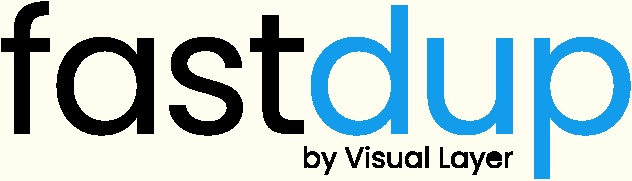

Generating gallery:   0%|          | 0/408 [00:00<?, ?it/s]

Failed to read image from img_path /root/datasets/FinalDataset/paper/paper294(1)(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper294(1)(1).jpg Failed to read image /root/datasets/FinalDataset/paper/paper294(1)(1).jpg orig filename /root/datasets/FinalDataset/paper/paper294(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper294(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper294(1).jpg Failed to read image /root/datasets/FinalDataset/paper/paper294(1).jpg orig filename /root/datasets/FinalDataset/paper/paper294(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_1512.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_1512.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_1512.jpg orig filename /root/datasets/FinalDataset/paper/paper_1512.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2982.

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper294(1)(1).jpg orig filename /root/datasets/FinalDataset/paper/paper294(1)(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper294(1)(1).jpg orig filename /root/datasets/FinalDataset/paper/paper294(1)(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " 

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_192.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_192.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_192.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_199.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_199.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_199.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_199.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_620.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_620.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_620.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_620.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic13(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/p

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_192.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_192.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_199.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_199.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic694.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic694.jpg orig filename /root/datasets/FinalDataset/plastic/plastic694.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard236(1)(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard236(1)(1).jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard236(1)(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard236(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard61.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard61.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard61.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard61.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_691.jpg
Failed to generate 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic3(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic3(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic3(1)(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic3(1)(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image 

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic786.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic786.jpg orig filename /root/datasets/FinalDataset/plastic/plastic786.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_1762.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_1762.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_1762.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1762.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_2327.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_2327.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_2327.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_2327.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic149(1).jpg
Failed to generate viz for images /root/datasets/FinalDat

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic784.jpg orig filename /root/datasets/FinalDataset/plastic/plastic784.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic147(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic147(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + 

 /root/datasets/FinalDataset/plastic/plastic_2411.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_2411.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_2411.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_2411.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard877.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard877.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard877.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard877.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_3639.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_3639.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_3639.jpg orig filename /root/datasets/FinalDataset/glass/glass_3639.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_3933.jpg
Failed to 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic137(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic137(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic137(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic137(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read imag

Failed to read image /root/datasets/FinalDataset/plastic/plastic_1289.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_1289.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic118(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic118(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic118(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic118(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic521.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic521.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic521.jpg orig filename /root/datasets/FinalDataset/plastic/plastic521.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_499.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_499.jpg Failed to read image /root/datasets/FinalDataset/plastic/p

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper477(1).jpg orig filename /root/datasets/FinalDataset/paper/paper477(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_2833.jpg orig filename /root/datasets/FinalDataset/paper/paper_2833.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + "

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic677.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic677.jpg orig filename /root/datasets/FinalDataset/plastic/plastic677.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard477.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard477.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard477.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard477.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic195(1)(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic195(1)(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic195(1)(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic195(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic195(1).jpg
Failed to generate viz for images

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_3081.jpg orig filename /root/datasets/FinalDataset/glass/glass_3081.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_3081.jpg orig filename /root/datasets/FinalDataset/glass/glass_3081.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard247.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard247.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard247.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard387(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard387(1).jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard387(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard387(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_699.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_699.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_699.jpg orig filename /root/datasets/FinalDataset/trash/trash_699.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2985.jpg
Failed to generate viz for images /root/datasets/F

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash90.jpg orig filename /root/datasets/FinalDataset/trash/trash90.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_90.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_90.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename

Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_918.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_918.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_918.jpg orig filename /root/datasets/FinalDataset/paper/paper_918.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_1511.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_1511.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_1511.jpg orig filename /root/datasets/FinalDataset/paper/paper_1511.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper350(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper350(1).jpg Failed to read image /root/datasets/FinalDataset/paper/paper350(1).jpg orig filename /root/datasets/FinalDataset/paper/paper350(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper350(1)(1).jpg
Failed to ge

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_2836.jpg orig filename /root/datasets/FinalDataset/paper/paper_2836.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_2836.jpg orig filename /root/datasets/FinalDataset/paper/paper_2836.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_3395.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_3395.jpg orig filename /root/datasets/FinalDataset/glass/glass_3395.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_843.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_843.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_843.jpg orig filename /root/datasets/FinalDataset/glass/glass_843.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_488.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_488.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_488.jpg orig filename /root/datasets/FinalDataset/paper/paper_488.jpg
Failed to read image from img_path /root/datasets/FinalDataset/paper/paper_2118.jpg
Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_2118.jpg Failed to read image /roo

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_2274.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_2274.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_2540.jpg orig filename /root/datasets/FinalDataset/glass/glass_2540.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filena

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic391.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic391.jpg orig filename /root/datasets/FinalDataset/plastic/plastic391.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_745.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_745.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_745.jpg orig filename /root/datasets/FinalDataset/trash/trash_745.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash295.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash295.jpg Failed to read image /root/datasets/FinalDataset/trash/trash295.jpg orig filename /root/datasets/FinalDataset/trash/trash295.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_19.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_19.jpg Failed to read imag

  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic781.jpg orig filename /root/datasets/FinalDataset/plastic/plastic781.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic781.jpg orig filename /root/datasets/FinalDataset/plastic/plastic781.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filen

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_617.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_617.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_617.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic164(1)(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic164(1)(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic164(1)(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic164(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic164(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic164(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic164(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic164(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/metal/metal_1698.jpg
Failed to generate viz for images /root

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_898.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_898.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_898.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_898.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to r

Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic778.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic778.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic778.jpg orig filename /root/datasets/FinalDataset/plastic/plastic778.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic154(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic154(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic154(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic154(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_803.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_803.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_803.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_803.jpg
Failed to read image from img_path /root/datasets/FinalDatas

AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper67(1).jpg orig filename /root/datasets/FinalDataset/paper/paper67(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_870.jpg orig filename /root/datasets/FinalDataset/paper/paper_870.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_870.jpg orig filename /root/datasets/FinalDataset/paper/paper_870.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.1

Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_433.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_433.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_433.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic166(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic166(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic166(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic166(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_2234.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_2234.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_2234.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_2234.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic168.jpg
Failed to generate viz for images /root/datasets/Fina

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_1918.jpg orig filename /root/datasets/FinalDataset/paper/paper_1918.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper_1918.jpg orig filename /root/datasets/FinalDataset/paper/paper_1918.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard295(1)(1).jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard295(1)(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard295(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard133.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard133.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard133.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard133.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic52(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic52(1).jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic52(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic52(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic52(1)(1).jpg
Failed to generat

  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash_563.jpg orig filename /root/datasets/FinalDataset/trash/trash_563.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash127(1).jpg orig filename /root/datasets/FinalDataset/trash/trash127(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
As

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard179.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard179.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard179.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic_723.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic_723.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic_723.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_723.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic326.jpg
Failed to generate viz for images /root/datasets/FinalDataset/plastic/plastic326.jpg Failed to read image /root/datasets/FinalDataset/plastic/plastic326.jpg orig filename /root/datasets/FinalDataset/plastic/plastic326.jpg
Failed to read image from img_path /root/datasets/FinalDataset/plastic/plastic45(1).jpg
Failed to generate viz for images /root/datasets/FinalData

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic833.jpg orig filename /root/datasets/FinalDataset/plastic/plastic833.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_5.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_5.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename

/root/datasets/FinalDataset/glass/glass_3253.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_3253.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_3253.jpg orig filename /root/datasets/FinalDataset/glass/glass_3253.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_623.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_623.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_623.jpg orig filename /root/datasets/FinalDataset/trash/trash_623.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash59.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash59.jpg Failed to read image /root/datasets/FinalDataset/trash/trash59.jpg orig filename /root/datasets/FinalDataset/trash/trash59.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_3496.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_1829.jpg orig filename /root/datasets/FinalDataset/glass/glass_1829.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/glass/glass_1829.jpg orig filename /root/datasets/FinalDataset/glass/glass_1829.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " o

Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard354(1)(1).jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard354(1)(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard354(1)(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_2325.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_2325.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_2325.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_2325.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard354(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard354(1).jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard354(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard354(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboa

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper55.jpg orig filename /root/datasets/FinalDataset/paper/paper55.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/paper/paper55.jpg orig filename /root/datasets/FinalDataset/paper/paper55.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash221.jpg Failed to read image /root/datasets/FinalDataset/trash/trash221.jpg orig filename /root/datasets/FinalDataset/trash/trash221.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard174.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard174.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard174.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard174.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_562.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_562.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_562.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_562.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard328(1)(1).jpg
Failed to generate viz for images /root/da

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal372(1)(1).jpg orig filename /root/datasets/FinalDataset/metal/metal372(1)(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/metal/metal350.jpg orig filename /root/datasets/FinalDataset/metal/metal350.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename +

Failed to generate viz for images /root/datasets/FinalDataset/paper/paper_1687.jpg Failed to read image /root/datasets/FinalDataset/paper/paper_1687.jpg orig filename /root/datasets/FinalDataset/paper/paper_1687.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_538.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_538.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_538.jpg orig filename /root/datasets/FinalDataset/trash/trash_538.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4540.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4540.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_4540.jpg orig filename /root/datasets/FinalDataset/glass/glass_4540.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4448.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4448.jpg Failed to read image 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_573.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_573.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic_573.jpg orig filename /root/datasets/FinalDataset/plastic/plastic_573.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + fi

Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_3378.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_3378.jpg orig filename /root/datasets/FinalDataset/glass/glass_3378.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard98.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard98.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard98.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard98.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard_501.jpg
Failed to generate viz for images /root/datasets/FinalDataset/cardboard/cardboard_501.jpg Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_501.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_501.jpg
Failed to read image from img_path /root/datasets/FinalDataset/cardboard/cardboard267(1)(1).jpg
Failed to generate viz for images /root/

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic229(1)(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic229(1)(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/plastic/plastic229(1).jpg orig filename /root/datasets/FinalDataset/plastic/plastic229(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to rea

Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_1907.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_1907.jpg orig filename /root/datasets/FinalDataset/glass/glass_1907.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_1352.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_1352.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_1352.jpg orig filename /root/datasets/FinalDataset/glass/glass_1352.jpg
Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_1819.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_1819.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_1819.jpg orig filename /root/datasets/FinalDataset/glass/glass_1819.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_56.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_56.jpg Failed to read image 

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard_1717.jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard_1717.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/cardboard/cardboard313(1).jpg orig filename /root/datasets/FinalDataset/cardboard/cardboard313(1).jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Faile

Failed to generate viz for images /root/datasets/FinalDataset/trash/trash197.jpg Failed to read image /root/datasets/FinalDataset/trash/trash197.jpg orig filename /root/datasets/FinalDataset/trash/trash197.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash_319.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash_319.jpg Failed to read image /root/datasets/FinalDataset/trash/trash_319.jpg orig filename /root/datasets/FinalDataset/trash/trash_319.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash29(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash29(1).jpg Failed to read image /root/datasets/FinalDataset/trash/trash29(1).jpg orig filename /root/datasets/FinalDataset/trash/trash29(1).jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash3(1).jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash3(1).jpg Failed to read image /root/da

Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash276.jpg orig filename /root/datasets/FinalDataset/trash/trash276.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig filename " + row['filename']
AssertionError: Failed to read image /root/datasets/FinalDataset/trash/trash276.jpg orig filename /root/datasets/FinalDataset/trash/trash276.jpg
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/fastdup/galleries.py", line 1663, in do_create_stats_gallery
    assert img is not None, "Failed to read image " + filename + " orig file

Failed to read image from img_path /root/datasets/FinalDataset/glass/glass_4536.jpg
Failed to generate viz for images /root/datasets/FinalDataset/glass/glass_4536.jpg Failed to read image /root/datasets/FinalDataset/glass/glass_4536.jpg orig filename /root/datasets/FinalDataset/glass/glass_4536.jpg
Failed to read image from img_path /root/datasets/FinalDataset/trash/trash571.jpg
Failed to generate viz for images /root/datasets/FinalDataset/trash/trash571.jpg Failed to read image /root/datasets/FinalDataset/trash/trash571.jpg orig filename /root/datasets/FinalDataset/trash/trash571.jpg
Stored blur visual view in  /root/datasets/CleanedDataset/galleries/blur.html
########################################################################################
Would you like to see awesome visualizations for some of the most popular academic datasets?
Click here to see and learn more: https://app.visual-layer.com/vl-datasets?utm_source=fastdup
######################################################


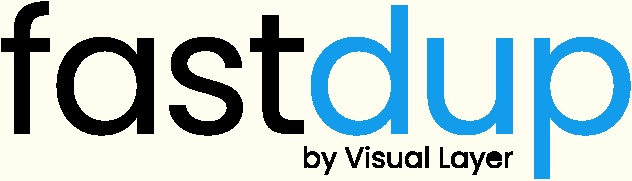
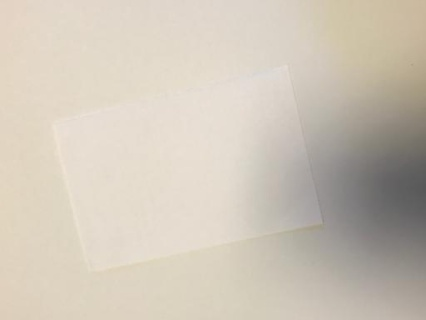
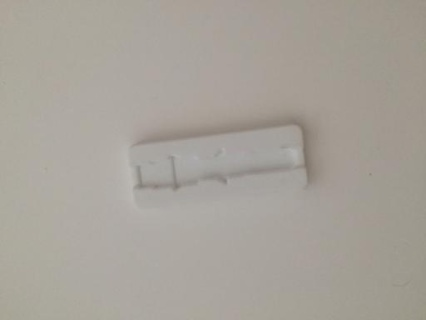
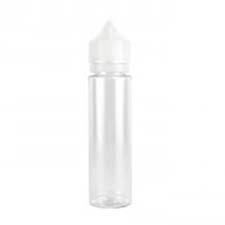
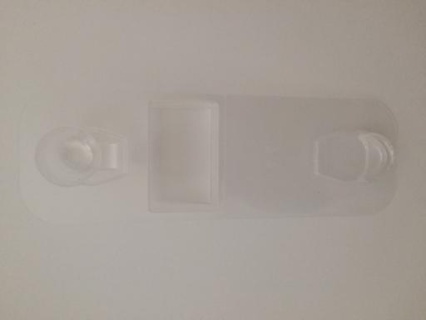
...
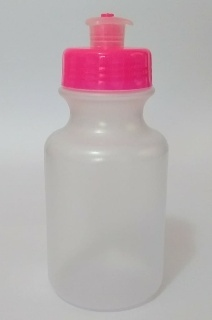
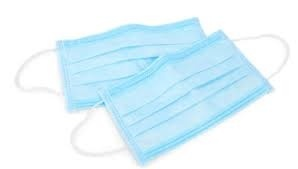
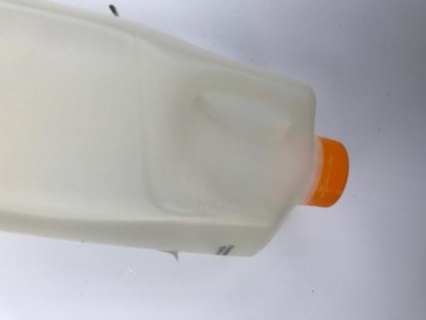
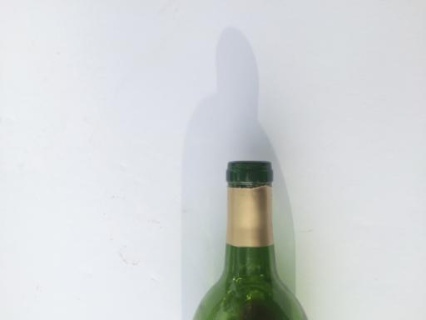
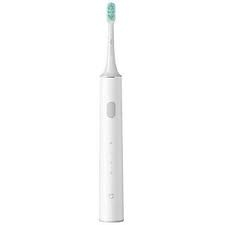

0

In [ ]:
dark_path = '/root/datasets/CleanedDataset/galleries/dark.html'
bright_path = '/root/datasets/CleanedDataset/galleries/bright.html'
fd.vis.stats_gallery(save_path= dark_path, metric='dark', num_images=49)
fd.vis.stats_gallery(save_path= bright_path, metric='bright', num_images=3222, lazy_load=True)
fd.vis.stats_gallery(metric='blur', num_images=408)

In [ ]:
stats_df = fd.img_stats()
dark_images = stats_df[stats_df['mean'] < 13]
dark_images
list_of_dark_images = dark_images['filename'].to_list()
list_of_dark_images
print(len(list_of_dark_images))
bright_images = stats_df[stats_df['mean'] > 220.5]
bright_images.head()
list_of_bright_images = bright_images['filename'].to_list()
list_of_bright_images
print(len(list_of_bright_images))
blurry_images = stats_df[stats_df['blur'] < 50]
blurry_images.head()
list_of_blurry_images = blurry_images['filename'].to_list()
list_of_blurry_images
print(len(list_of_blurry_images))
list_of_bad_images = []
list_of_bad_images.extend(list_of_dark_images)
print(len(list_of_bad_images))

49
3222
408
49


In [ ]:
for dark_file in list_of_dark_images:
  if os.path.exists(dark_file):
    os.remove(dark_file)

print("Samples after removing dark images:")
print()
num_sample_in_class()

Samples after removing dark images:

Number of images in class cardboard: 1626
Number of images in class glass: 2732
Number of images in class metal: 1028
Number of images in class paper: 1765
Number of images in class plastic: 1741
Number of images in class trash: 2304


In [ ]:
for outlier_file in list_of_outliers:
  if os.path.exists(outlier_file):
    os.remove(outlier_file)

print("Samples after removing outlier images:")
print()
num_sample_in_class()

Samples after removing outlier images:

Number of images in class cardboard: 1606
Number of images in class glass: 2682
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 2296


In [ ]:
# not removing blurry or bright to make models life harder

for blurry_file in list_of_blurry_images:
  if os.path.exists(blurry_file):
    os.remove(blurry_file)
num_sample_in_class()

In [ ]:
for bright_file in list_of_bright_images:
  if os.path.exists(bright_file):
    os.remove(bright_file)
num_sample_in_class()

###Augmentations

In [ ]:
import os
from torchvision import transforms
import torch
import torchvision.transforms.functional as TF
from PIL import Image

# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
trash_folder = os.path.join(FinalDataset, 'trash')
trash_augmented_folder = os.path.join(FinalDataset, 'trash_augmented')

# Create the 'trash_augmented' folder if it doesn't exist
os.makedirs(trash_augmented_folder, exist_ok=True)

# Apply data augmentation to the 'trash' class and save the augmented images
for root, _, files in os.walk(trash_folder):
    for file in files:
        image_path = os.path.join(root, file)
        #image = Image.open(image_path)
        image = Image.open(image_path).convert('RGB')
        transformed_image = data_transform(image)
        save_path = os.path.join(trash_augmented_folder, f"augmented_{file}")
        torchvision.utils.save_image(transformed_image, save_path)

# Print the new number of images in each class
num_sample_in_class()


Number of images in class cardboard: 1606
Number of images in class glass: 2682
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 2296


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
trash_augmented_folder = os.path.join(FinalDataset, 'trash_augmented')
trash_folder = os.path.join(FinalDataset, 'trash')

# Move all files from 'trash_augmented' to 'trash'
for file in os.listdir(trash_augmented_folder):
    src = os.path.join(trash_augmented_folder, file)
    dst = os.path.join(trash_folder, file)
    shutil.move(src, dst)

# Remove the now-empty 'trash_augmented' folder
os.rmdir(trash_augmented_folder)

# Print the new number of images in the 'trash' class
num_images_trash = len(os.listdir(trash_folder))
print(f"Number of images in class trash: {num_images_trash}")


Number of images in class trash: 4592


In [ ]:
import shutil

# Define the path to the 'trash_augmented' folder
trash_augmented_folder = '/root/datasets/FinalDataset/trash_augmented'

# Delete the folder and its contents
shutil.rmtree(trash_augmented_folder)

# Check if the folder has been deleted
if not os.path.exists(trash_augmented_folder):
    print("Folder deleted successfully.")
else:
    print("Failed to delete folder.")

In [ ]:
#cardboard

# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
trash_folder = os.path.join(FinalDataset, 'cardboard')
trash_augmented_folder = os.path.join(FinalDataset, 'cardboard_augmented')

# Create the 'trash_augmented' folder if it doesn't exist
os.makedirs(trash_augmented_folder, exist_ok=True)

# Apply data augmentation to the 'trash' class and save the augmented images
for root, _, files in os.walk(trash_folder):
    for file in files:
        image_path = os.path.join(root, file)
        #image = Image.open(image_path)
        image = Image.open(image_path).convert('RGB')
        transformed_image = data_transform(image)
        save_path = os.path.join(trash_augmented_folder, f"augmented_{file}")
        torchvision.utils.save_image(transformed_image, save_path)

# Print the new number of images in each class
num_sample_in_class()


Number of images in class cardboard: 1606
Number of images in class glass: 2682
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
trash_augmented_folder = os.path.join(FinalDataset, 'cardboard_augmented')
trash_folder = os.path.join(FinalDataset, 'cardboard')

# Move all files from 'trash_augmented' to 'trash'
for file in os.listdir(trash_augmented_folder):
    src = os.path.join(trash_augmented_folder, file)
    dst = os.path.join(trash_folder, file)
    shutil.move(src, dst)

# Remove the now-empty 'trash_augmented' folder
os.rmdir(trash_augmented_folder)

# Print the new number of images in the 'trash' class
num_sample_in_class()


Number of images in class cardboard: 3212
Number of images in class glass: 2682
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
#glass

import PIL
# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
folder = os.path.join(FinalDataset, 'glass')
augmented_folder = os.path.join(FinalDataset, 'glass_augmented')

# Create the 'trash_augmented' folder if it doesn't exist
os.makedirs(augmented_folder, exist_ok=True)

# Apply data augmentation to the 'trash' class and save the augmented images
for root, _, files in os.walk(folder):
    for file in files:
        if not file.startswith('.'):  # Skip system files
            image_path = os.path.join(root, file)
            try:
                image = Image.open(image_path).convert('RGB')
                transformed_image = data_transform(image)
                save_path = os.path.join(augmented_folder, f"augmented_{file}")
                torchvision.utils.save_image(transformed_image, save_path)
            except (OSError, UnidentifiedImageError):
                continue

# Print the new number of images in each class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 2682
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
augmented_folder = os.path.join(FinalDataset, 'glass_augmented')
folder = os.path.join(FinalDataset, 'glass')

# Move all files
for file in os.listdir(augmented_folder):
    src = os.path.join(augmented_folder, file)
    dst = os.path.join(folder, file)
    shutil.move(src, dst)

# Remove the now-empty folder
os.rmdir(augmented_folder)

# Print the new number of images in the class
num_sample_in_class()


Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
#metal

import PIL
# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
folder = os.path.join(FinalDataset, 'metal')
augmented_folder = os.path.join(FinalDataset, 'metal_augmented')

# Create the folder if it doesn't exist
os.makedirs(augmented_folder, exist_ok=True)

# Apply data augmentation to the folder class and save the augmented images
for root, _, files in os.walk(folder):
    for file in files:
        if not file.startswith('.'):  # Skip system files
            image_path = os.path.join(root, file)
            try:
                image = Image.open(image_path).convert('RGB')
                transformed_image = data_transform(image)
                save_path = os.path.join(augmented_folder, f"augmented_{file}")
                torchvision.utils.save_image(transformed_image, save_path)
            except (OSError, UnidentifiedImageError):
                continue

# Print the new number of images in each class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 1025
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
augmented_folder = os.path.join(FinalDataset, 'metal_augmented')
folder = os.path.join(FinalDataset, 'metal')

# Move all files
for file in os.listdir(augmented_folder):
    src = os.path.join(augmented_folder, file)
    dst = os.path.join(folder, file)
    shutil.move(src, dst)

# Remove the now-empty folder
os.rmdir(augmented_folder)

# Print the new number of images in the class
num_sample_in_class()


Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
#paper

import PIL
# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
folder = os.path.join(FinalDataset, 'paper')
augmented_folder = os.path.join(FinalDataset, 'paper_augmented')

# Create the folder if it doesn't exist
os.makedirs(augmented_folder, exist_ok=True)

# Apply data augmentation to the folder class and save the augmented images
for root, _, files in os.walk(folder):
    for file in files:
        if not file.startswith('.'):  # Skip system files
            image_path = os.path.join(root, file)
            try:
                image = Image.open(image_path).convert('RGB')
                transformed_image = data_transform(image)
                save_path = os.path.join(augmented_folder, f"augmented_{file}")
                torchvision.utils.save_image(transformed_image, save_path)
            except (OSError, UnidentifiedImageError):
                continue

# Print the new number of images in each class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 1746
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
augmented_folder = os.path.join(FinalDataset, 'paper_augmented')
folder = os.path.join(FinalDataset, 'paper')

# Move all files
for file in os.listdir(augmented_folder):
    src = os.path.join(augmented_folder, file)
    dst = os.path.join(folder, file)
    shutil.move(src, dst)

# Remove the now-empty folder
os.rmdir(augmented_folder)

# Print the new number of images in the class
num_sample_in_class()


Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 3492
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
#plastic

import PIL
# Define data transformations for augmentation
data_transform = transforms.Compose([
    transforms.RandomRotation(30),            # Randomly rotate the image by 30 degrees
    transforms.RandomHorizontalFlip(),        # Randomly flip the image horizontally
    transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1), #Colour jitter
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),  # Randomly crop and resize the image
    transforms.GaussianBlur(kernel_size=5),   # Add Gausian Blur
    transforms.ToTensor(),                    # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
folder = os.path.join(FinalDataset, 'plastic')
augmented_folder = os.path.join(FinalDataset, 'plastic_augmented')

# Create the folder if it doesn't exist
os.makedirs(augmented_folder, exist_ok=True)

# Apply data augmentation to the folder class and save the augmented images
for root, _, files in os.walk(folder):
    for file in files:
        if not file.startswith('.'):  # Skip system files
            image_path = os.path.join(root, file)
            try:
                image = Image.open(image_path).convert('RGB')
                transformed_image = data_transform(image)
                save_path = os.path.join(augmented_folder, f"augmented_{file}")
                torchvision.utils.save_image(transformed_image, save_path)
            except (OSError, UnidentifiedImageError):
                continue

# Print the new number of images in each class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 3492
Number of images in class plastic: 1730
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
augmented_folder = os.path.join(FinalDataset, 'plastic_augmented')
folder = os.path.join(FinalDataset, 'plastic')

# Move all files
for file in os.listdir(augmented_folder):
    src = os.path.join(augmented_folder, file)
    dst = os.path.join(folder, file)
    shutil.move(src, dst)

# Remove the now-empty folder
os.rmdir(augmented_folder)

# Print the new number of images in the class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 3492
Number of images in class plastic: 3460
Number of images in class trash: 4592


In [ ]:
import os
import zipfile

# Define the path to the FinalDataset folder
FinalDataset = '/root/datasets/FinalDataset'

# Define the path to the zip file
zip_file = '/root/datasets/FinalDataset_imbalanced.zip'

# Create a zip file and add the contents of the FinalDataset folder to it
with zipfile.ZipFile(zip_file, 'w') as zipf:
    for root, _, files in os.walk(FinalDataset):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, FinalDataset))

print(f"FinalDataset folder zipped to {zip_file}")


FinalDataset folder zipped to /root/datasets/FinalDataset_imbalanced.zip


In [ ]:
# Download the zip file to your local machine
from google.colab import files
files.download('/root/datasets/FinalDataset_imbalanced.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#Sanity check load dataset

os.makedirs('/root/imbalance_dataset')
!unzip '/content/gdrive/My Drive/Third Year/APS360/Imbalanced_dataset/FinalDataset_imbalanced.zip' -d '/root/imbalance_dataset'

In [ ]:
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 3492
Number of images in class plastic: 3460
Number of images in class trash: 4592


##Make the Dataset Balanced

In [ ]:
#increase metal further but with different transforms


import PIL
# Define data transformations for augmentation

data_transform = transforms.Compose([
    transforms.RandomRotation(degrees=(-10, 10)),  # Randomly rotate the image by -10 to 10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Randomly change brightness, contrast, saturation, and hue
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.8, 1.2), shear=0),  # Random affine transformation with translation, scaling, and no shear
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomVerticalFlip(),  # Randomly flip the image vertically
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
])

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
folder = os.path.join(FinalDataset, 'metal')
augmented_folder = os.path.join(FinalDataset, 'metal_augmented')

# Create the folder if it doesn't exist
os.makedirs(augmented_folder, exist_ok=True)

# Apply data augmentation to the folder class and save the augmented images
for root, _, files in os.walk(folder):
    for file in files:
        if not file.startswith('.'):  # Skip system files
            image_path = os.path.join(root, file)
            try:
                image = Image.open(image_path).convert('RGB')
                transformed_image = data_transform(image)
                save_path = os.path.join(augmented_folder, f"augmented_{file}")
                torchvision.utils.save_image(transformed_image, save_path)
            except (OSError, UnidentifiedImageError):
                continue

# Print the new number of images in each class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 2050
Number of images in class paper: 3492
Number of images in class plastic: 3460
Number of images in class trash: 4592


In [ ]:
import os
import shutil

# Define the paths
FinalDataset = '/root/datasets/FinalDataset'
augmented_folder = os.path.join(FinalDataset, 'metal_augmented')
folder = os.path.join(FinalDataset, 'metal')

# Move all files
for file in os.listdir(augmented_folder):
    src = os.path.join(augmented_folder, file)
    dst = os.path.join(folder, file)
    shutil.move(src, dst)

# Remove the now-empty folder
os.rmdir(augmented_folder)

# Print the new number of images in the class
num_sample_in_class()

Number of images in class cardboard: 3212
Number of images in class glass: 5364
Number of images in class metal: 3075
Number of images in class paper: 3492
Number of images in class plastic: 3460
Number of images in class trash: 4592


In [ ]:
import os
import random

# Define the target number of images per class (max number among all classes)
target_num_images = 3075

# Loop through each class
for className in classes:
    class_folder = os.path.join(FinalDataset, className)
    num_images = len(os.listdir(class_folder)) if os.path.exists(class_folder) else 0
    if num_images > target_num_images:
        # Calculate the number of excessive images
        num_excessive_images = num_images - target_num_images
        # Get a list of all images in the class folder
        images = os.listdir(class_folder)
        # Delete excessive images randomly
        images_to_delete = random.sample(images, num_excessive_images)
        for image_name in images_to_delete:
            os.remove(os.path.join(class_folder, image_name))

    # Print the new number of images in the class
    num_images_after_deletion = len(os.listdir(class_folder)) if os.path.exists(class_folder) else 0
    print(f"Number of images in class {className}: {num_images_after_deletion}")



Number of images in class cardboard: 3075
Number of images in class glass: 3075
Number of images in class metal: 3075
Number of images in class paper: 3075
Number of images in class plastic: 3075
Number of images in class trash: 3075


In [ ]:
num_sample_in_class()

Number of images in class cardboard: 3075
Number of images in class glass: 3075
Number of images in class metal: 3075
Number of images in class paper: 3074
Number of images in class plastic: 3075
Number of images in class trash: 3075


In [ ]:
import os
import zipfile

# Define the path to the FinalDataset folder
FinalDataset = '/root/datasets/FinalDataset'

# Define the path to the zip file
zip_file = '/root/datasets/FinalDataset_balanced.zip'

# Create a zip file and add the contents of the FinalDataset folder to it
with zipfile.ZipFile(zip_file, 'w') as zipf:
    for root, _, files in os.walk(FinalDataset):
        for file in files:
            file_path = os.path.join(root, file)
            zipf.write(file_path, os.path.relpath(file_path, FinalDataset))

print(f"FinalDataset folder zipped to {zip_file}")

FileNotFoundError: [Errno 2] No such file or directory: '/root/datasets/FinalDataset_balanced.zip'

In [ ]:
# Download the zip file to your local machine
from google.colab import files
files.download('/root/datasets/FinalDataset_balanced.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##FINAL DATASET

In [ ]:
#Sanity check load dataset

os.makedirs('/root/balanced_dataset')
!unzip '/content/gdrive/My Drive/Third Year/APS360/balanced_dataset/FinalDataset_balanced.zip' -d '/root/balanced_dataset'

In [ ]:
num_sample_in_class()

Number of images in class cardboard: 3075
Number of images in class glass: 3075
Number of images in class metal: 3075
Number of images in class paper: 3074
Number of images in class plastic: 3075
Number of images in class trash: 3075


In [ ]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_images_from_folder(folder_path):
    # Get a list of all files in the folder
    files = os.listdir(folder_path)

    # Filter only image files (you can adjust this if needed)
    image_files = [file for file in files if file.endswith(('jpg', 'jpeg', 'png', 'gif'))]

    # Iterate through each image file and display it
    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        image = mpimg.imread(image_path)
        plt.imshow(image)
        plt.title(image_file)
        plt.axis('off')  # Turn off axis
        plt.show()

# Provide the path to the folder containing images
folder_path = '/root/balanced_dataset'
display_images_from_folder(folder_path)

# Data Distribution

In [ ]:
import pandas as pd

data = {
    'Before Cleaning': [4038, 4067, 3458, 4369, 4371, 3610],
    'After Cleaning': [1606, 2682, 1025, 1746, 1730, 2296],
    'After Augmentation': [3212, 5364, 2050, 3492, 3460, 4592],
    'Final Size': [3075, 3075, 3075, 3075, 3075, 3075]
}

df = pd.DataFrame(data, index=['Cardboard', 'Glass', 'Metal', 'Paper', 'Plastic', 'Trash'])
print(df)

           Before Cleaning  After Cleaning  After Augmentation  Final Size
Cardboard             4038            1606                3212        3075
Glass                 4067            2682                5364        3075
Metal                 3458            1025                2050        3075
Paper                 4369            1746                3492        3075
Plastic               4371            1730                3460        3075
Trash                 3610            2296                4592        3075


NameError: name 'plt' is not defined

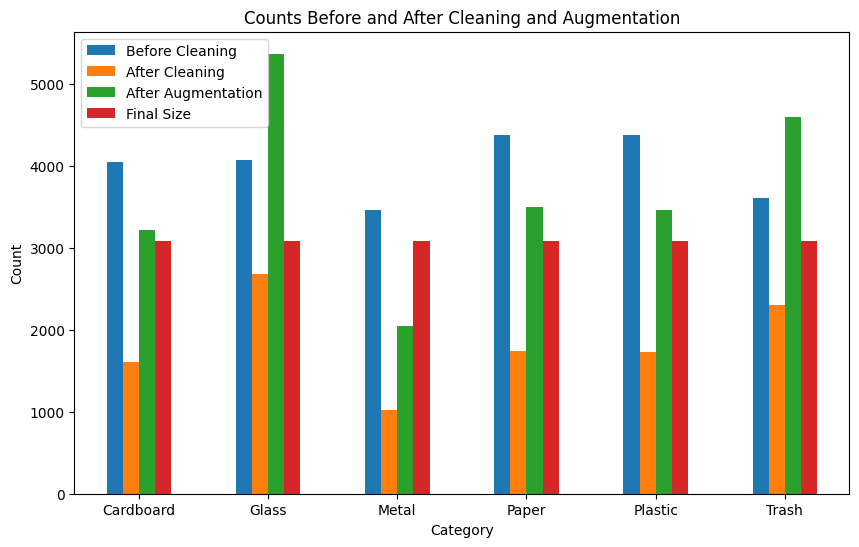

In [ ]:
# Plotting
ax = df.plot(kind='bar', figsize=(10, 6), rot=0)

# Adding labels and title
ax.set_ylabel('Count')
ax.set_xlabel('Category')
ax.set_title('Counts Before and After Cleaning and Augmentation')

# Show plot
plt.show()